In [27]:
import pandas as pd
import numpy as np
from warnings import filterwarnings
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2

filterwarnings("ignore")
pd.set_option('display.max_columns', None)

In [2]:
full_df = pd.read_csv('final_with_names_misha_16_5.csv')

In [4]:
full_df.head()

,paths,timestamps,sessionId,sessionString,epoch,time,type,event,clientX,clientY,x_normalized,y_normalized,time_event,tob_right_gaze_point_on_display_area_x_(3),tob_right_gaze_point_on_display_area_y_(4),tob_left_gaze_point_on_display_area_x_(44),tob_left_gaze_point_on_display_area_y_(45),tob_right_pupil_validity_(1),tob_left_pupil_validity_(22),tob_left_gaze_origin_validity_(6),tob_right_gaze_origin_validity_(38),tob_left_gaze_point_validity_(40),tob_right_gaze_point_validity_(42),tob_true_time_(26),tob_device_time_stamp_(51),tob_system_time_stamp_(8)
0,./0_new_data/P_15/1491933738937_2_-study-dot_t...,1491933945537,1491933738937_2_/study/dot_test_instructions,1491933738937_2_/study/dot_test_instructions,1.491934e+12,390.92,recording start,video started,NaN,NaN,NaN,NaN,18:05:45.536999,0.411433,0.372445,0.389835,0.370716,1.0,1.0,1.0,1.0,1.0,1.0,1.491934e+12,3.600685e+11,1.491934e+15
1,./0_new_data/P_15/1491933738937_2_-study-dot_t...,1491933945570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.410963,0.376561,0.393927,0.389403,1.0,1.0,1.0,1.0,1.0,1.0,1.491934e+12,3.600685e+11,1.491934e+15
2,./0_new_data/P_15/1491933738937_2_-study-dot_t...,1491933945603,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.410912,0.369494,0.395871,0.386915,1.0,1.0,1.0,1.0,1.0,1.0,1.491934e+12,3.600685e+11,1.491934e+15
3,./0_new_data/P_15/1491933738937_2_-study-dot_t...,1491933945636,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.409900,0.366525,0.393679,0.398434,1.0,1.0,1.0,1.0,1.0,1.0,1.491934e+12,3.600686e+11,1.491934e+15
4,./0_new_data/P_15/1491933738937_2_-study-dot_t...,1491933945669,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.410756,0.366550,0.391497,0.391557,1.0,1.0,1.0,1.0,1.0,1.0,1.491934e+12,3.600686e+11,1.491934e+15


In [5]:
full_df["user"] = full_df.paths.apply(lambda x: x.split("/")[2])

In [6]:
participants_specs = pd.read_csv("./0_data/participant_characteristics.csv")

In [7]:
screen_sizes = participants_specs.groupby("Participant ID")[["Display Width (pixels)", "Display Height (pixels)"]].first()

In [8]:
full_df = full_df.merge(screen_sizes, how = "left", left_on = "user", right_on = "Participant ID")

In [9]:
full_df.shape

(1210722, 29)

In [10]:
full_df = full_df.rename(columns = {
    "tob_right_gaze_point_on_display_area_x_(3)": "tob_right_x",
    "tob_right_gaze_point_on_display_area_y_(4)": "tob_right_y",
    "tob_left_gaze_point_on_display_area_x_(44)": "tob_left_x",
    "tob_left_gaze_point_on_display_area_y_(45)": "tob_left_y",
    "Display Width (pixels)": "display_width",
    "Display Height (pixels)": "display_height",
    "tob_true_time_(26)": "tob_timestamps"
})

In [11]:
full_df["validity"] = full_df["tob_left_gaze_origin_validity_(6)"].astype(bool) & \
                      full_df["tob_right_gaze_origin_validity_(38)"].astype(bool) & \
                      full_df["tob_left_gaze_point_validity_(40)"].astype(bool) & \
                      full_df["tob_right_gaze_point_validity_(42)"].astype(bool) & \
                      full_df["tob_right_pupil_validity_(1)"].astype(bool) & \
                      full_df["tob_left_pupil_validity_(22)"].astype(bool)

In [12]:
print("Number of samples:", full_df[(~full_df["clientX"].isna()) | (~full_df["tob_right_x"].isna())].shape[0])
print("Number of annotated samples:", full_df[(~full_df["clientX"].isna())].shape[0])
print("Number of Tobii samples:", full_df[(~full_df["tob_right_x"].isna())].shape[0])
print("Number matched:", full_df[(~full_df["clientX"].isna()) & (~full_df["tob_right_x"].isna())].shape[0])

Number of samples: 1183465
Number of annotated samples: 85204
Number of Tobii samples: 1182140
Number matched: 83879


In [13]:
full_df[(~full_df["tob_right_x"].isna())]["validity"].value_counts().to_frame()

,count
validity,
True,748869
False,433271


In [16]:
tob_df = full_df[(~full_df["tob_right_x"].isna()) & (full_df["validity"])]

In [11]:
df_tmp = full_df[~full_df["clientX"].isna()]

In [57]:
df_tmp["type"].value_counts().to_frame()

,count
type,
mousemove,83977
mouseclick,1227


In [18]:
df_tmp["user"].value_counts().to_frame()

,count
user,
P_18,3481
P_10,3294
P_57,2951
P_01,2766
P_59,2683
P_13,2503
P_56,2436
P_17,2433
P_08,2393


## Plot the trajectories for matched points

### For 1 user

In [196]:
df_user = full_df[full_df["user"] == "P_18"].sort_values("timestamps")

In [197]:
df_user.columns

Index(['paths', 'timestamps', 'sessionId', 'sessionString', 'epoch', 'time',
       'type', 'event', 'clientX', 'clientY', 'x_normalized', 'y_normalized',
       'time_event', 'tob_right_x', 'tob_right_y', 'tob_left_x', 'tob_left_y',
       'tob_right_pupil_validity_(1)', 'tob_left_pupil_validity_(22)',
       'tob_left_gaze_origin_validity_(6)',
       'tob_right_gaze_origin_validity_(38)',
       'tob_left_gaze_point_validity_(40)',
       'tob_right_gaze_point_validity_(42)', 'tob_timestamps',
       'tob_device_time_stamp_(51)', 'tob_system_time_stamp_(8)', 'user',
       'display_width', 'display_height', 'validity'],
      dtype='object')

In [198]:
df_user = df_user[[
    "sessionId", "type", "timestamps", "tob_timestamps", "clientX", "clientY", "x_normalized", "y_normalized", "tob_right_x",
    "tob_right_y", "tob_left_x", "tob_left_y", "validity", "display_width", "display_height"]]

In [199]:
df_user_matched = df_user[(~df_user["clientX"].isna())]

In [200]:
df_user_matched["tob_x"] = (df_user_matched["tob_right_x"] + df_user_matched["tob_left_x"]) / 2 * df_user_matched["display_width"]

In [201]:
df_user_matched["tob_y"] = (df_user_matched["tob_right_y"] + df_user_matched["tob_left_y"]) / 2 * df_user_matched["display_height"]

In [202]:
def distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

In [203]:
df_user_matched["distance"] = df_user_matched[["clientX", "clientY", "tob_x", "tob_y"]].apply(lambda x: distance(*x), axis = 1)

In [204]:
df_user_matched["dt"] = (df_user_matched["timestamps"] - df_user_matched["tob_timestamps"]).abs()

In [205]:
df_user_matched = df_user_matched[df_user_matched["type"] == "mouseclick"]

In [206]:
df_user_matched.groupby("validity")["distance"].mean()

validity
False    1006.214592
True       99.213698
Name: distance, dtype: float64

In [207]:
print(f"Distance: {df_user_matched['distance'].mean()}+- {df_user_matched['distance'].std()}")

Distance: 582.9475081965136+- 541.2557300253294


In [208]:
print(f"dt: {df_user_matched['dt'].mean()}+- {df_user_matched['dt'].std()} milseconds")

dt: 12.45+- 2.7085864723073 milseconds


In [209]:
df_user_matched_ = df_user_matched[df_user_matched["validity"]]

In [210]:
print(f"Distance: {df_user_matched_['distance'].mean()}+- {df_user_matched_['distance'].std()}")

Distance: 99.21369825640889+- 59.38392268969061


In [211]:
df_user_matched_['distance'].median()

86.41825974164783

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


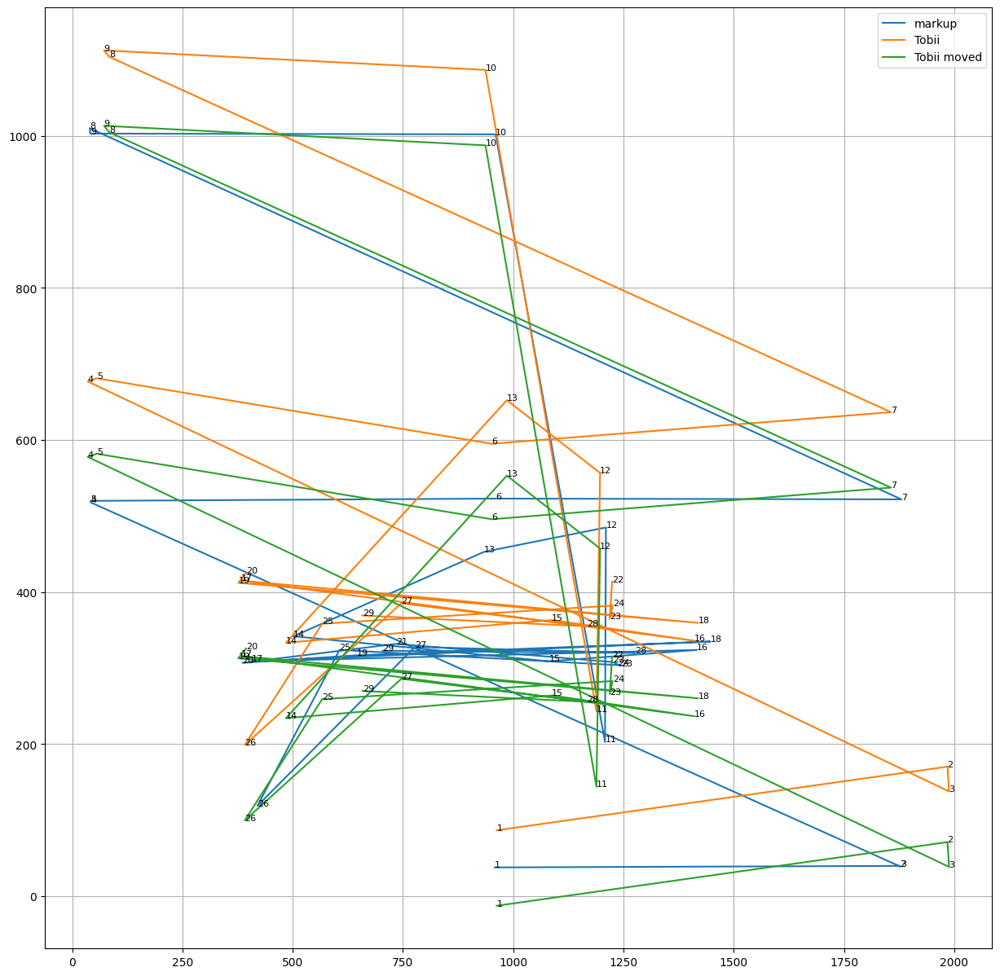

In [214]:
fig, ax = plt.subplots(figsize = (15, 15))
ax.plot(df_user_matched_["clientX"], df_user_matched_["clientY"], label = "markup")
ax.plot(df_user_matched_["tob_x"], df_user_matched_["tob_y"], label = "Tobii")
ax.plot(df_user_matched_["tob_x"], df_user_matched_["tob_y"] - df_user_matched_['distance'].mean(), label = "Tobii moved")
for i in range(df_user_matched_.shape[0]):
    ax.text(df_user_matched_["clientX"].values[i], df_user_matched_["clientY"].values[i], f"{i + 1}", fontsize=8)
for i in range(df_user_matched_.shape[0]):
    ax.text(df_user_matched_["tob_x"].values[i], df_user_matched_["tob_y"].values[i], f"{i + 1}", fontsize=8)
for i in range(df_user_matched_.shape[0]):
    ax.text(df_user_matched_["tob_x"].values[i], (df_user_matched_["tob_y"] - df_user_matched_['distance'].mean()).values[i], f"{i + 1}", fontsize=8)
plt.legend()
plt.grid()
plt.show();

### For all users

  0%|                                                                                                    | 0/44 [00:00<?, ?it/s]

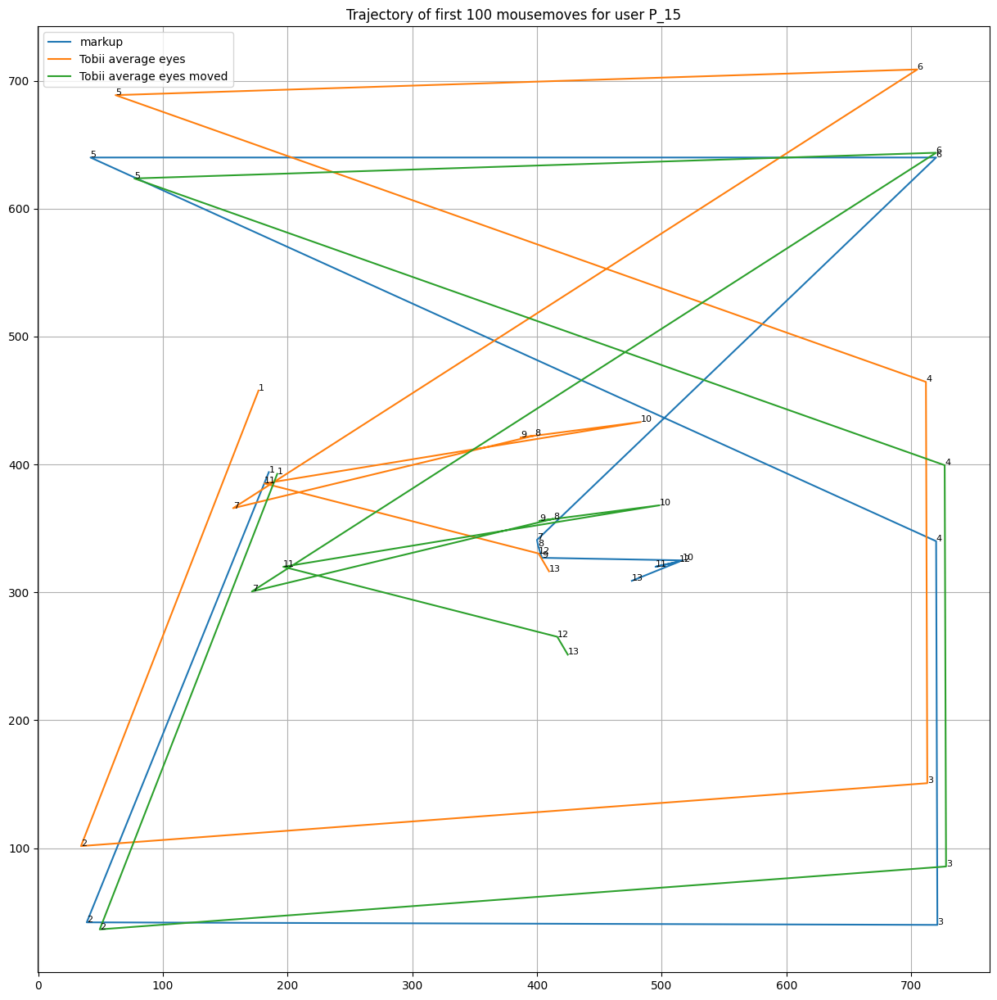

  2%|██                                                                                          | 1/44 [00:00<00:24,  1.78it/s]posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


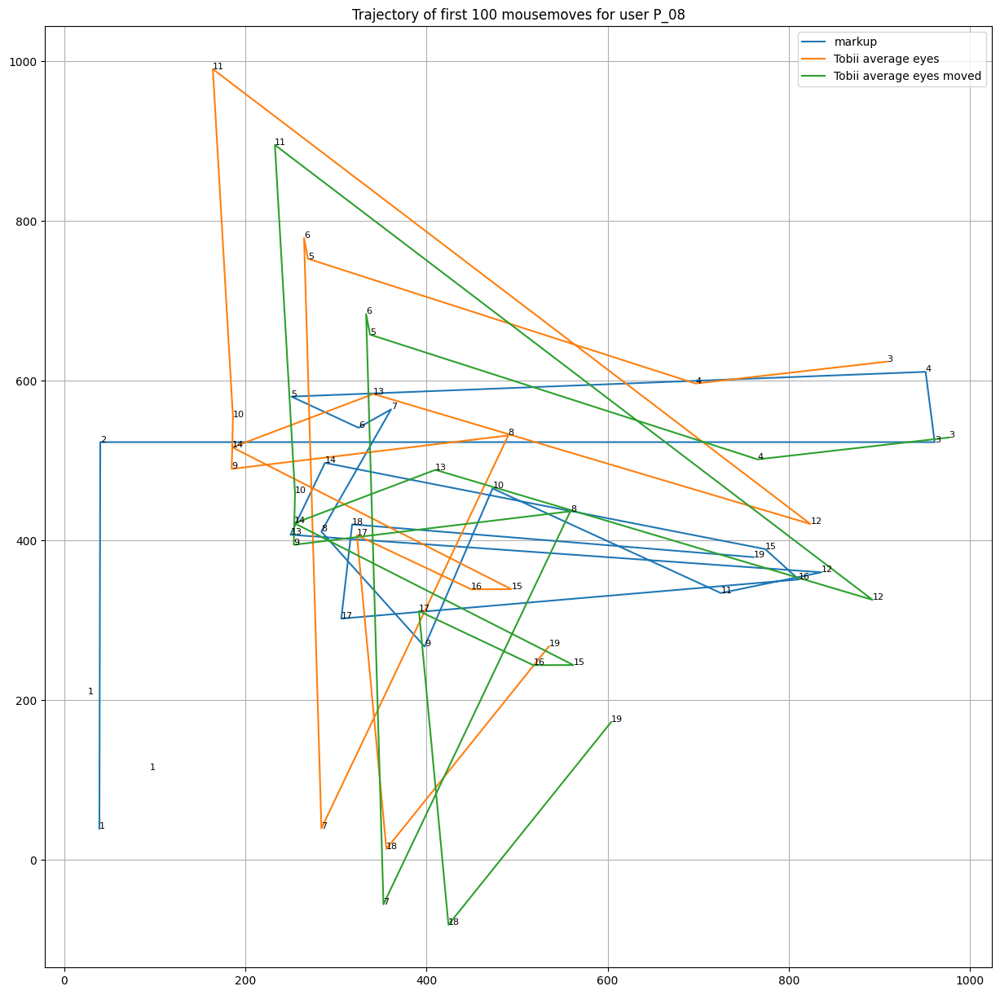

  5%|████▏                                                                                       | 2/44 [00:01<00:24,  1.75it/s]

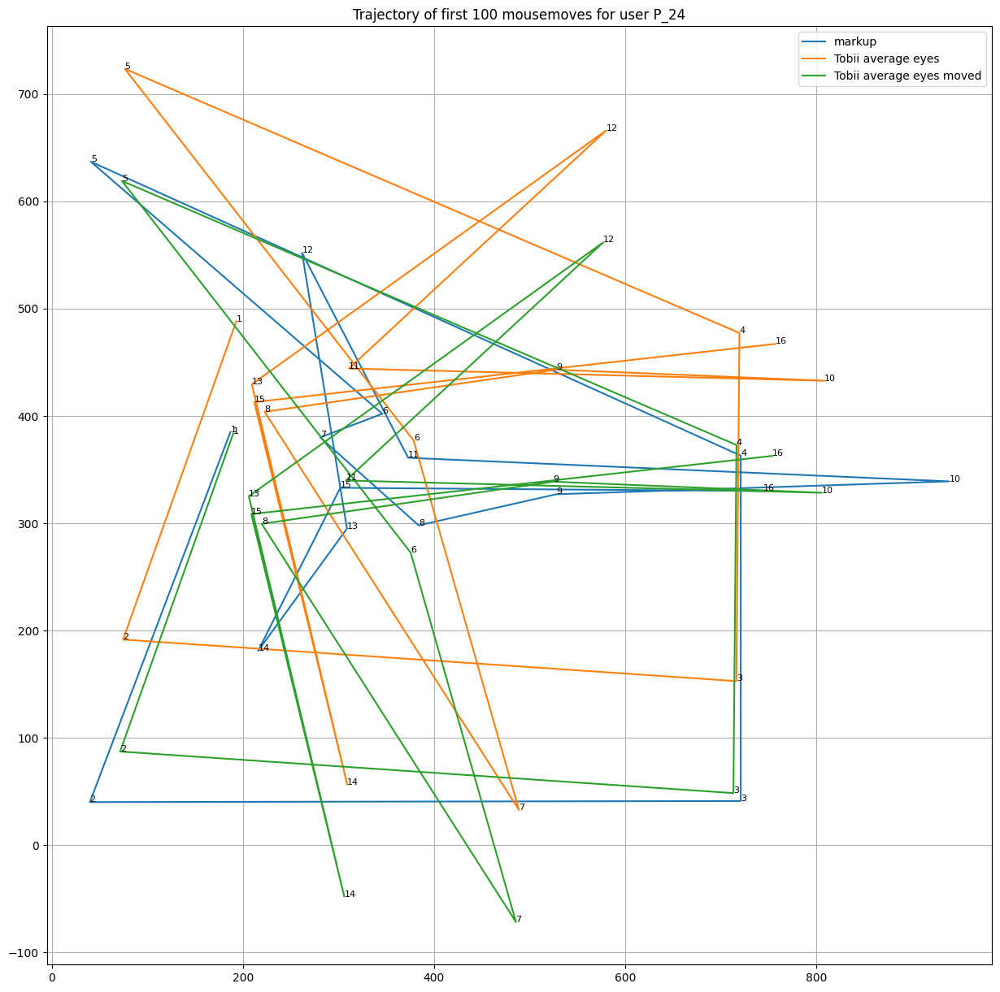

  7%|██████▎                                                                                     | 3/44 [00:01<00:23,  1.75it/s]

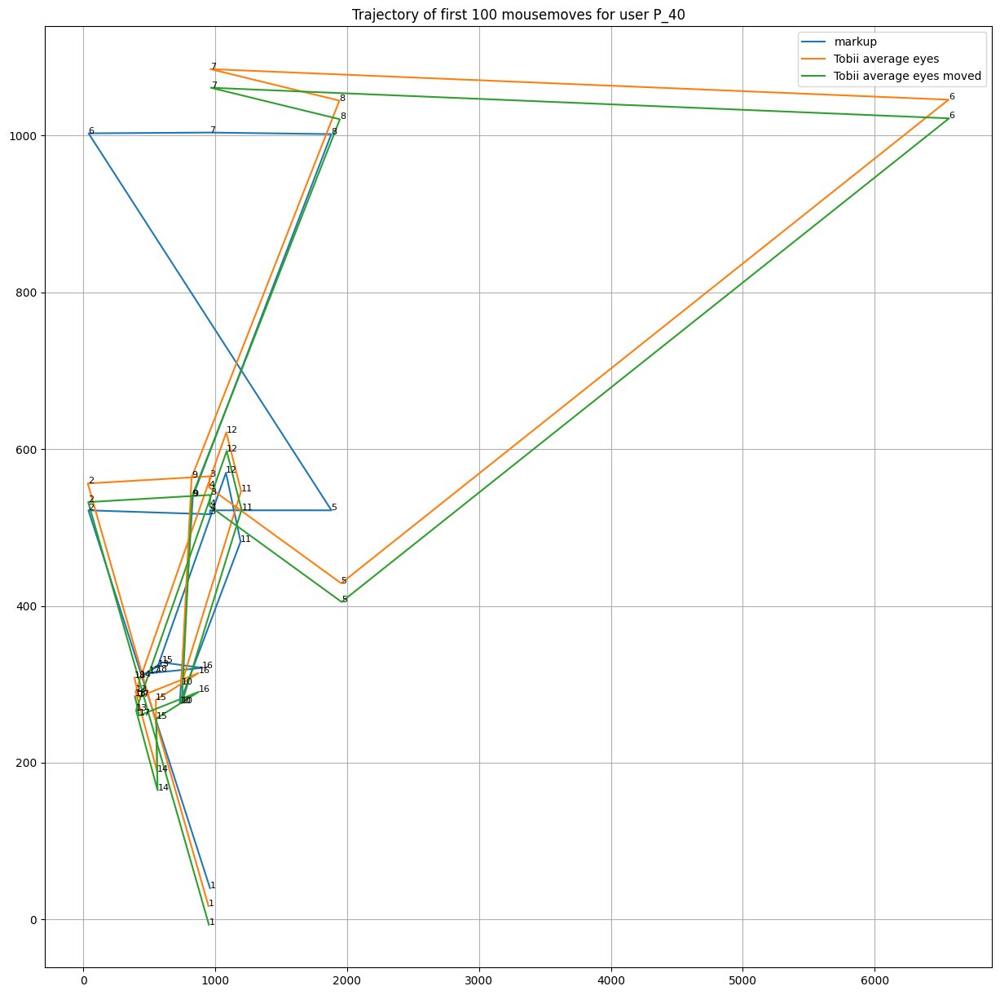

  9%|████████▎                                                                                   | 4/44 [00:02<00:22,  1.76it/s]

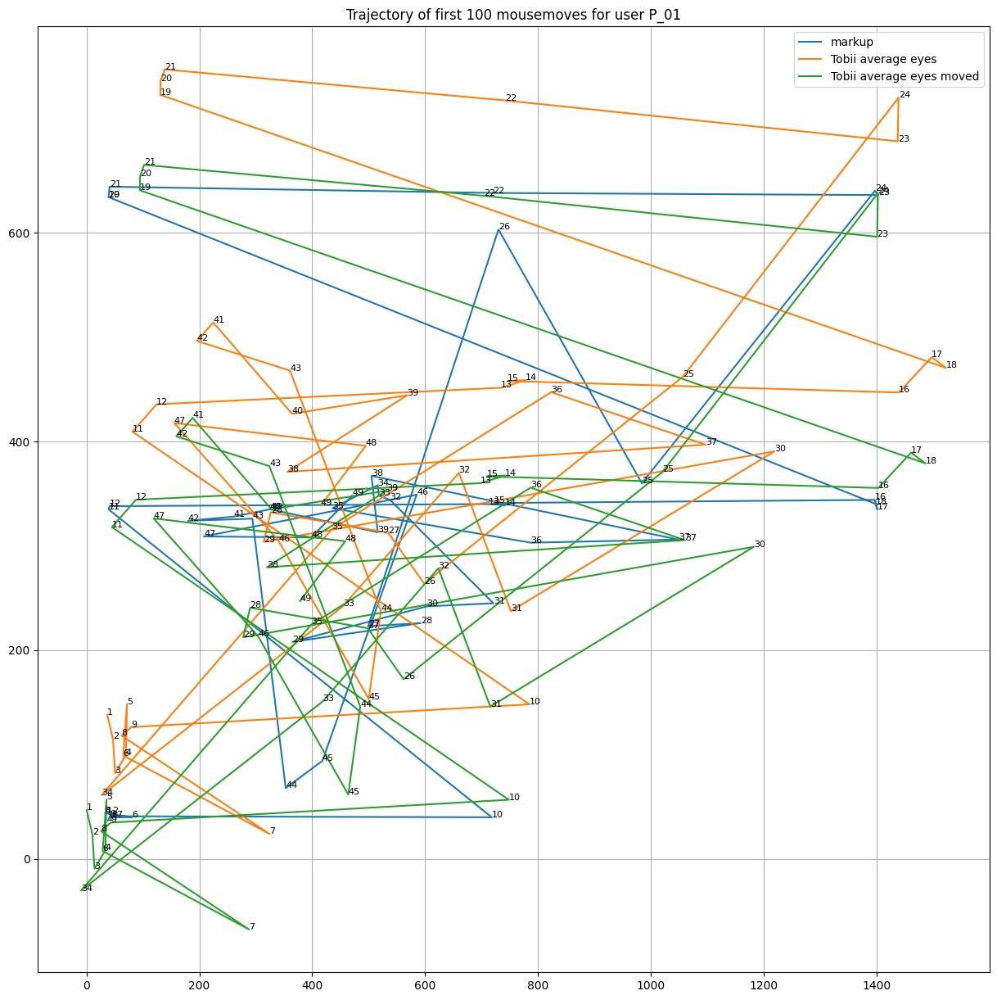

 11%|██████████▍                                                                                 | 5/44 [00:03<00:25,  1.56it/s]

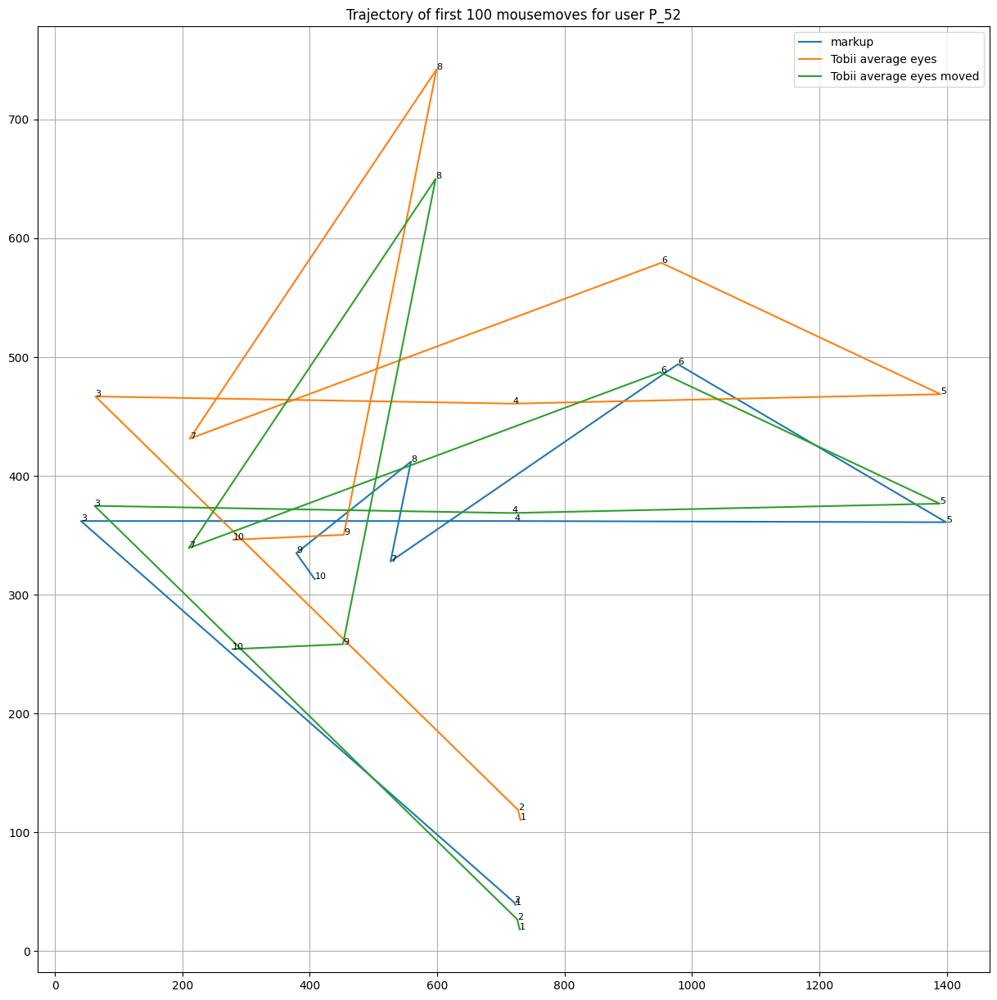

 14%|████████████▌                                                                               | 6/44 [00:03<00:22,  1.66it/s]

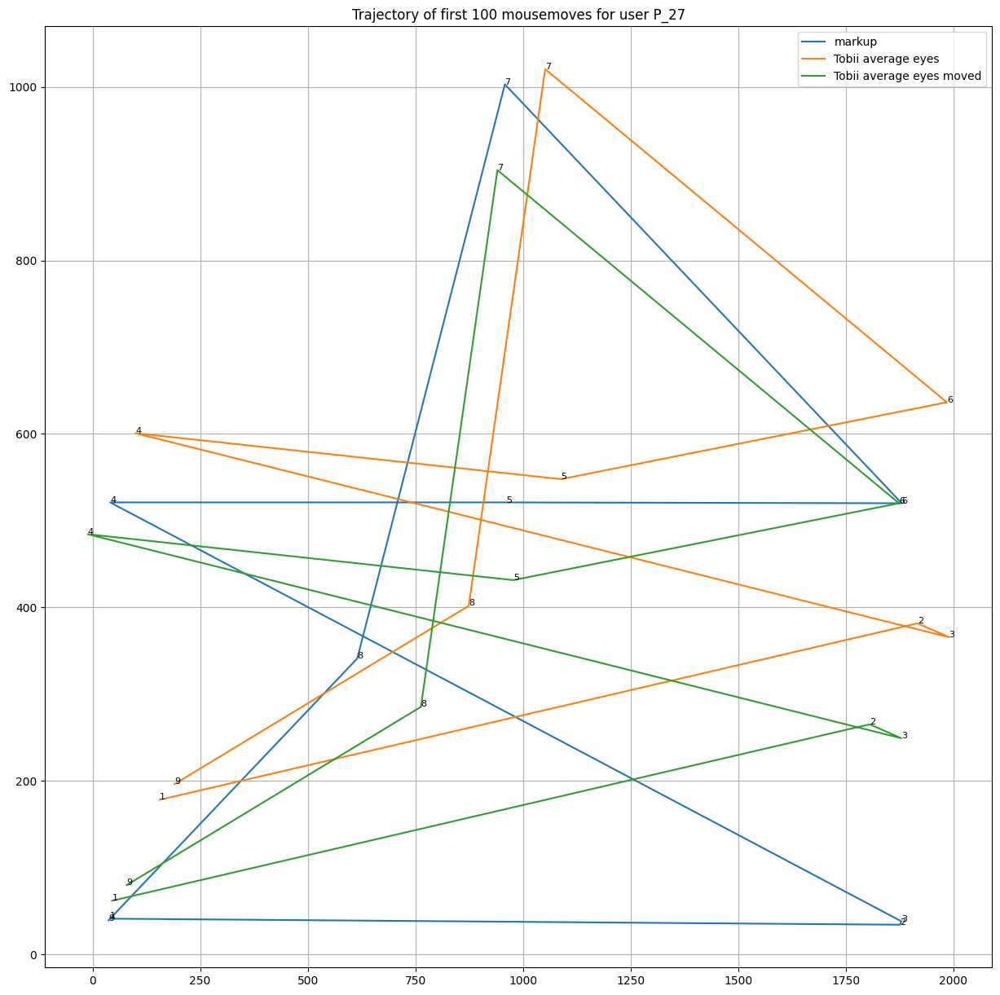

 16%|██████████████▋                                                                             | 7/44 [00:04<00:27,  1.35it/s]

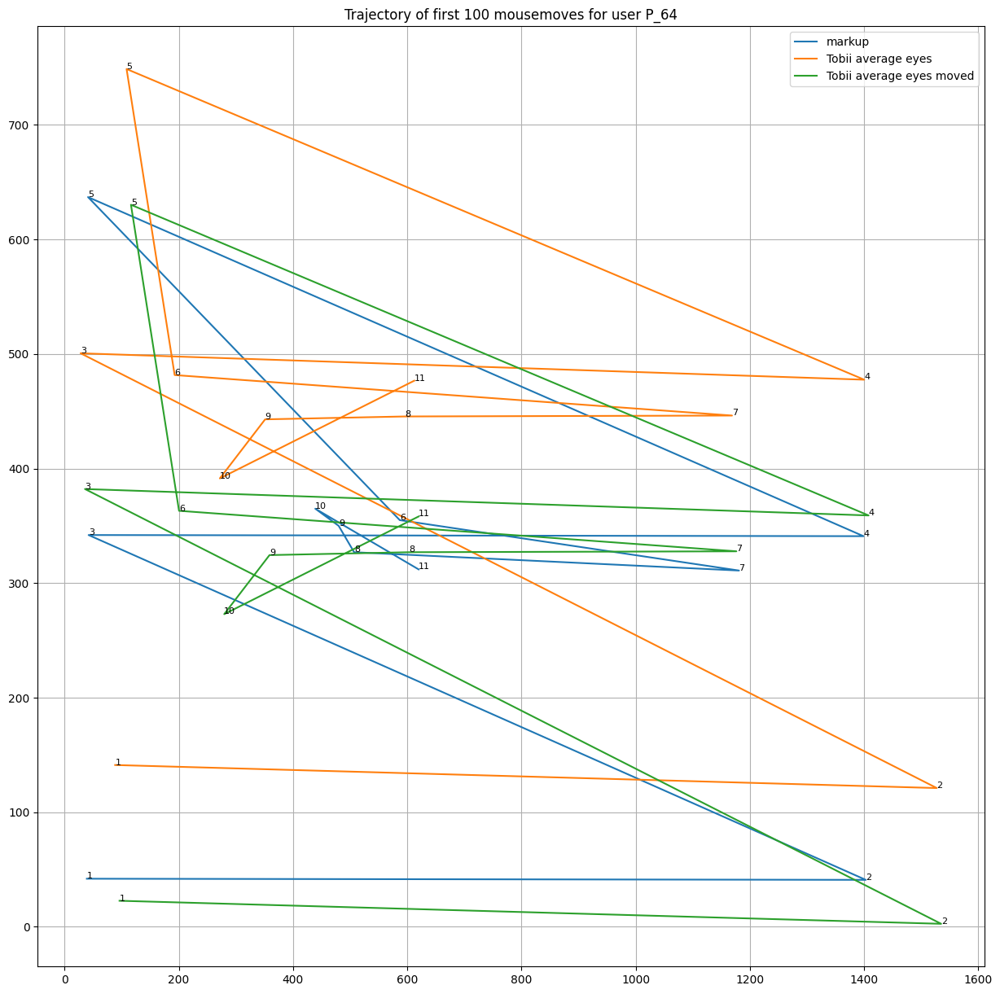

 18%|████████████████▋                                                                           | 8/44 [00:05<00:24,  1.47it/s]

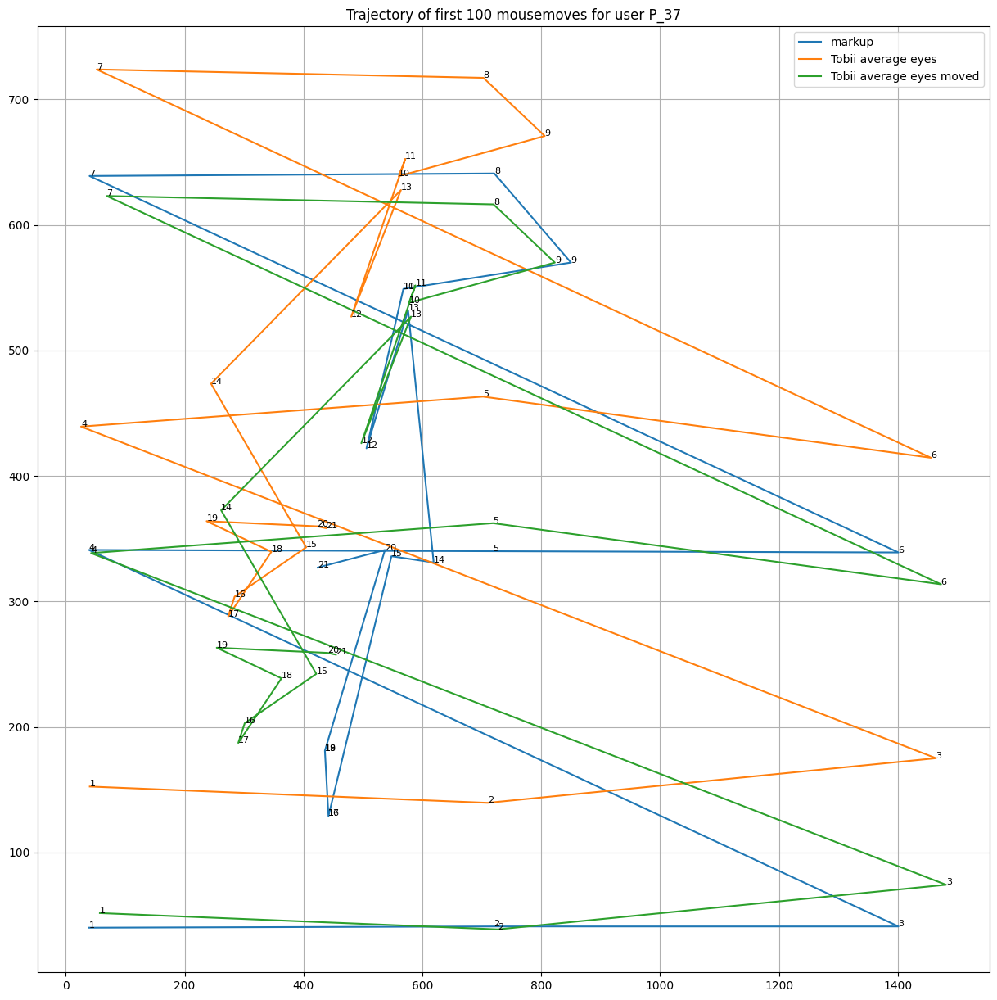

 20%|██████████████████▊                                                                         | 9/44 [00:05<00:22,  1.52it/s]posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


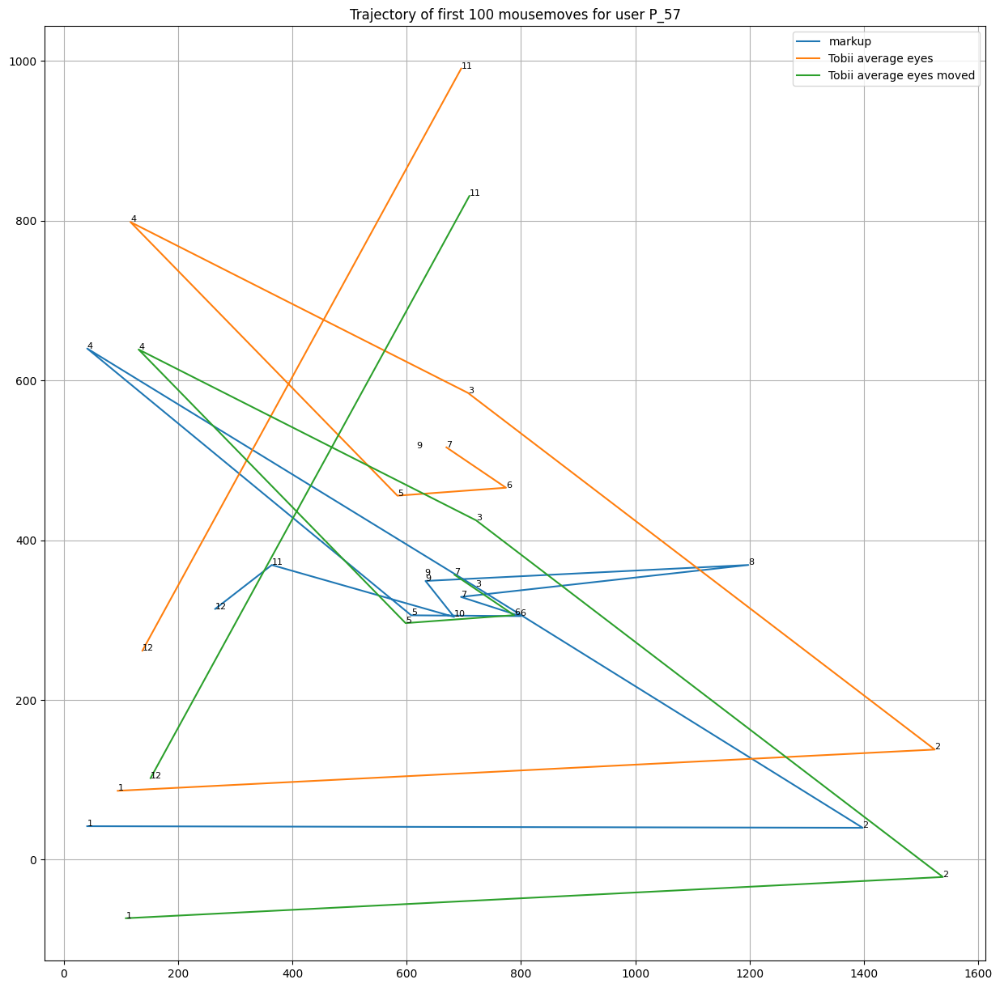

 23%|████████████████████▋                                                                      | 10/44 [00:06<00:21,  1.59it/s]

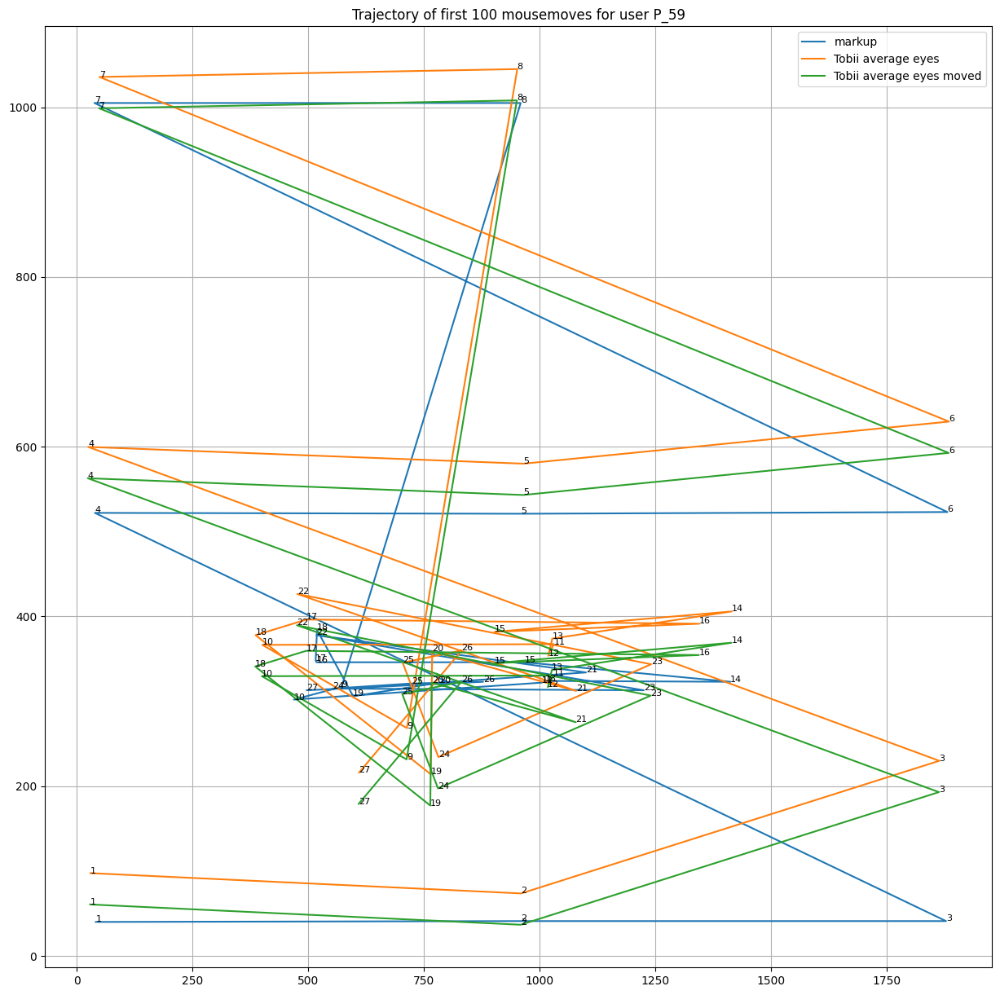

 25%|██████████████████████▊                                                                    | 11/44 [00:06<00:20,  1.58it/s]

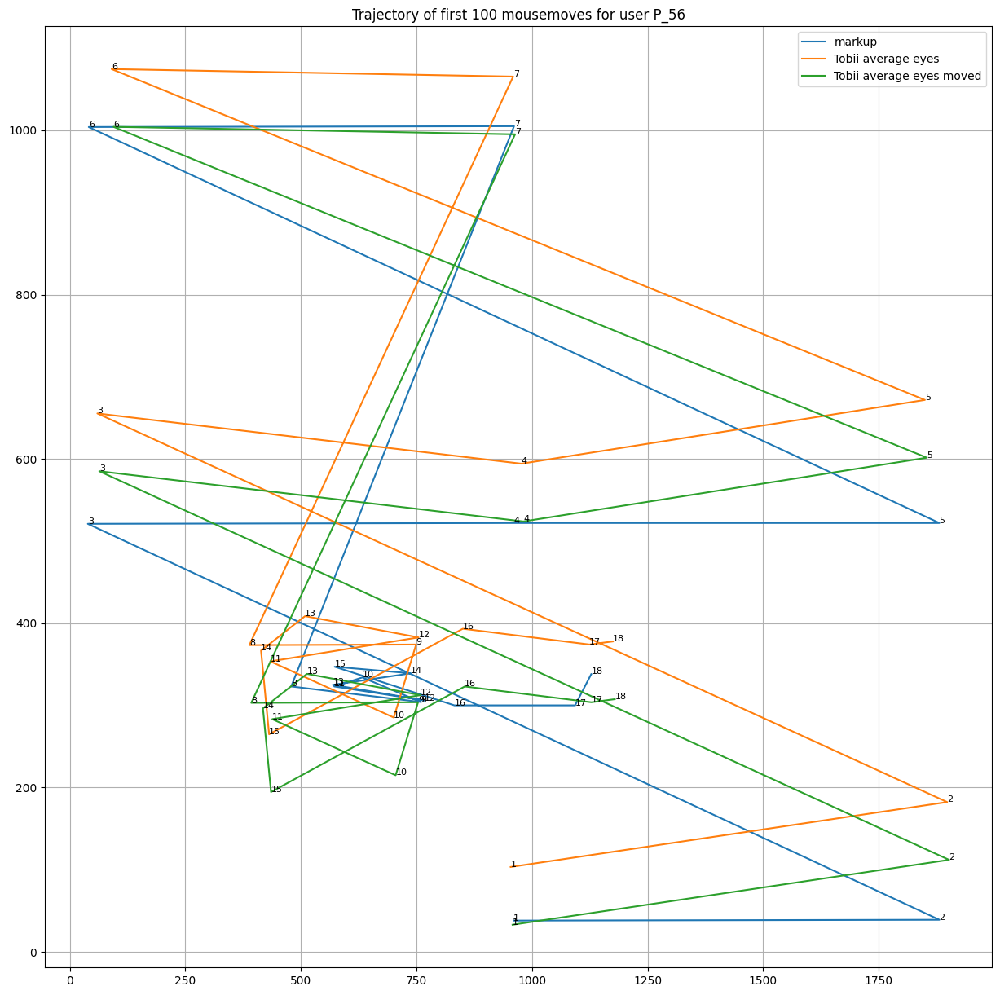

 27%|████████████████████████▊                                                                  | 12/44 [00:07<00:19,  1.62it/s]

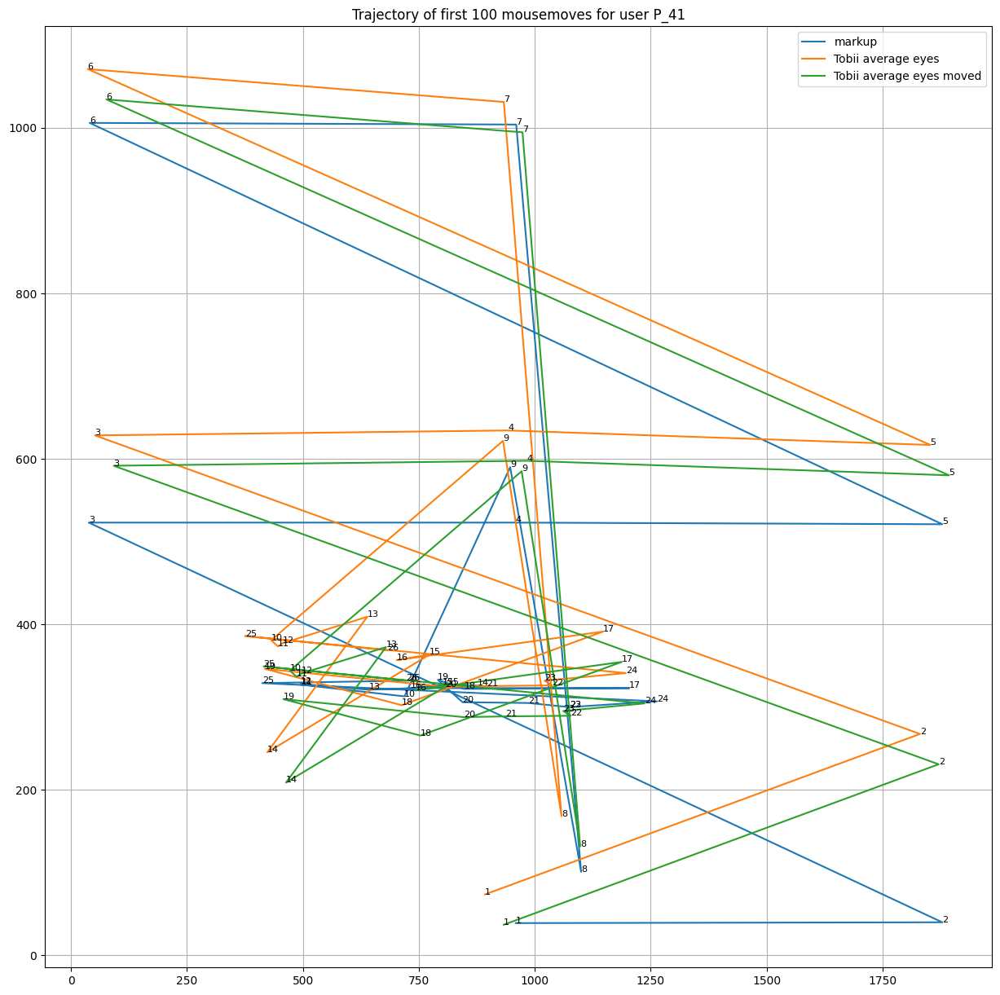

 30%|██████████████████████████▉                                                                | 13/44 [00:08<00:19,  1.61it/s]posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite value

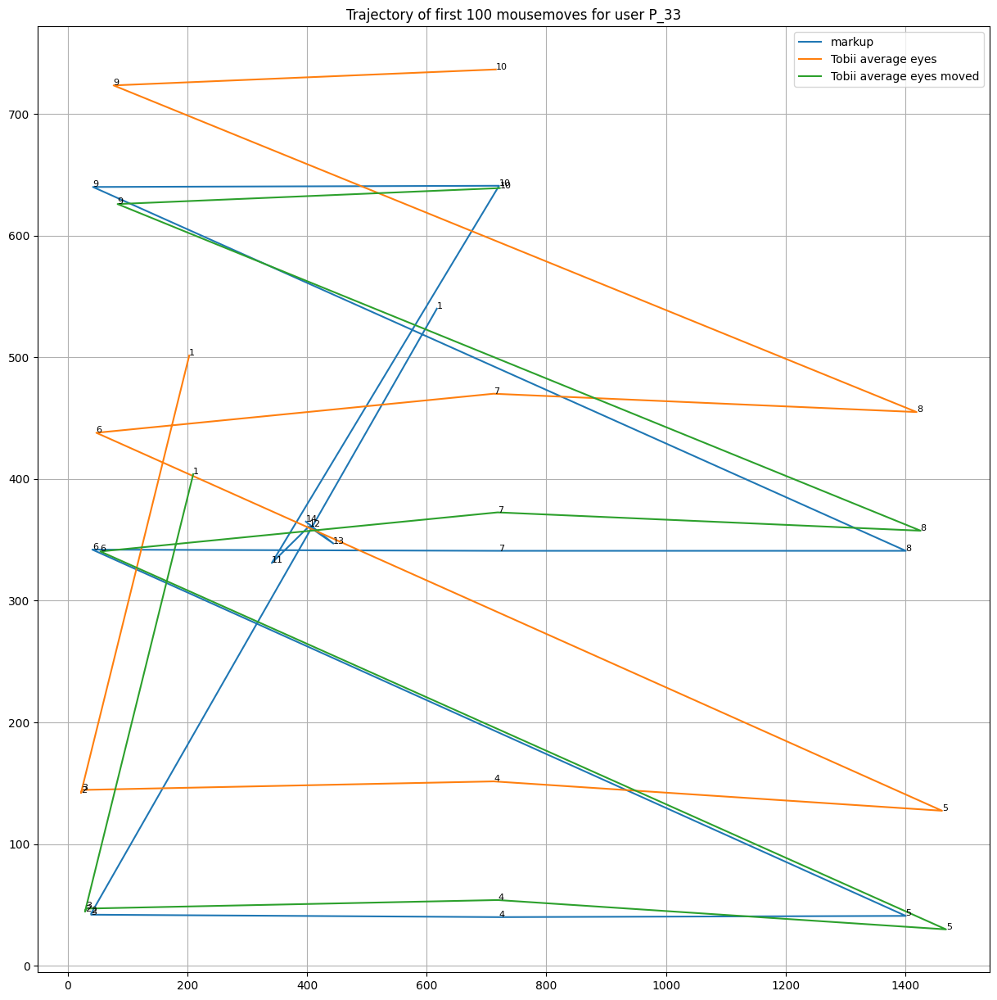

 32%|████████████████████████████▉                                                              | 14/44 [00:08<00:18,  1.64it/s]posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


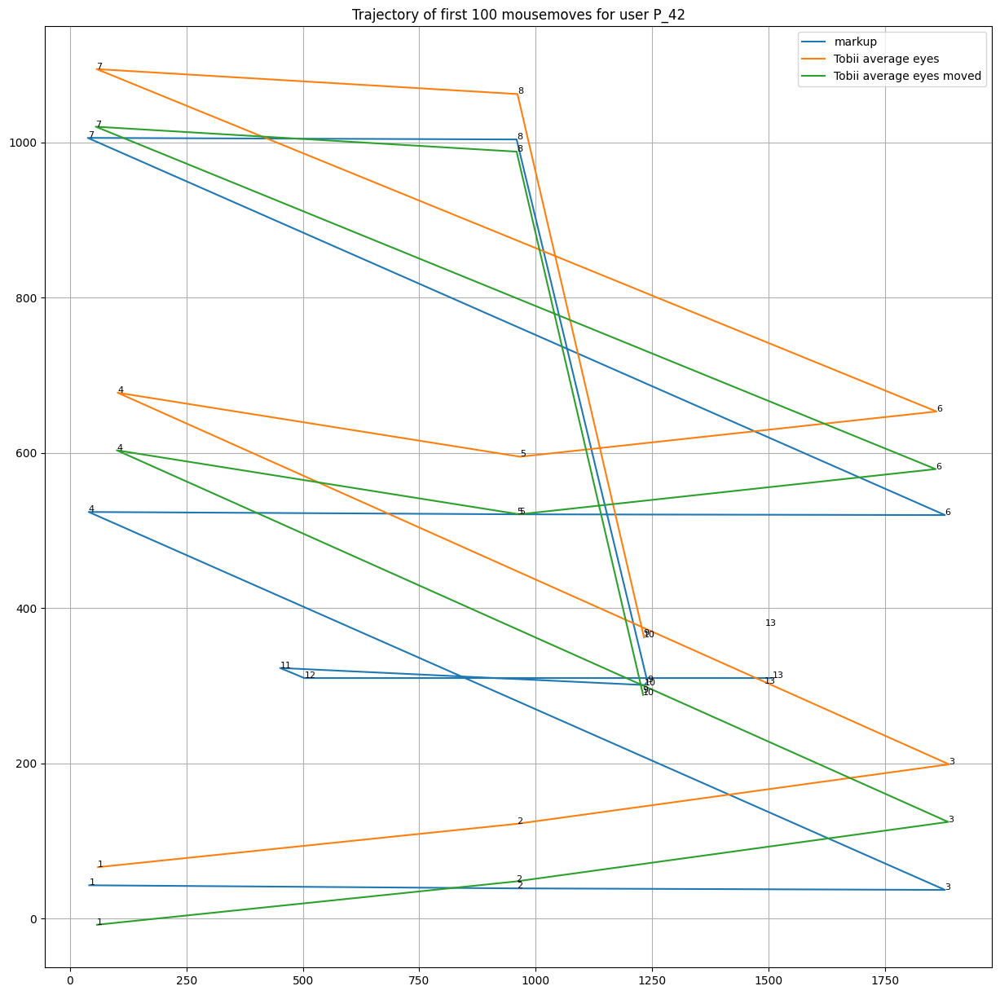

 34%|███████████████████████████████                                                            | 15/44 [00:09<00:17,  1.69it/s]

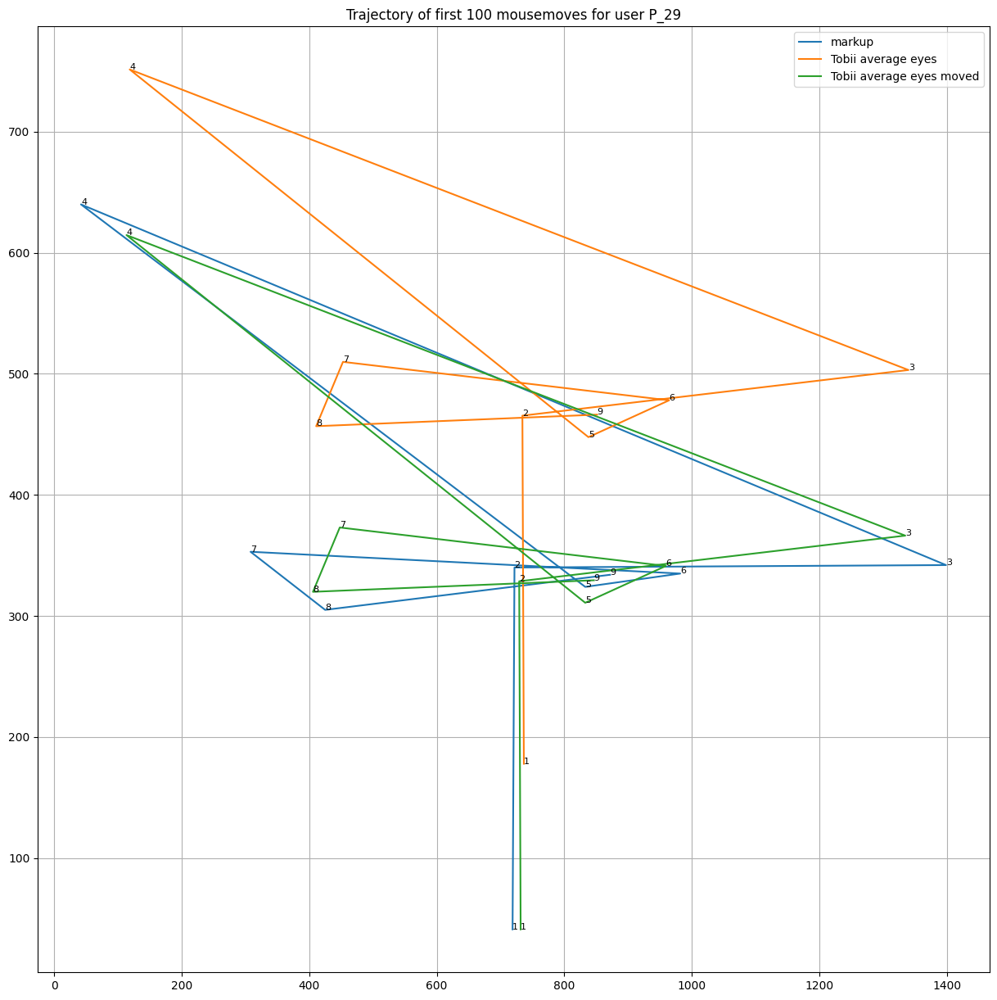

 36%|█████████████████████████████████                                                          | 16/44 [00:09<00:15,  1.76it/s]

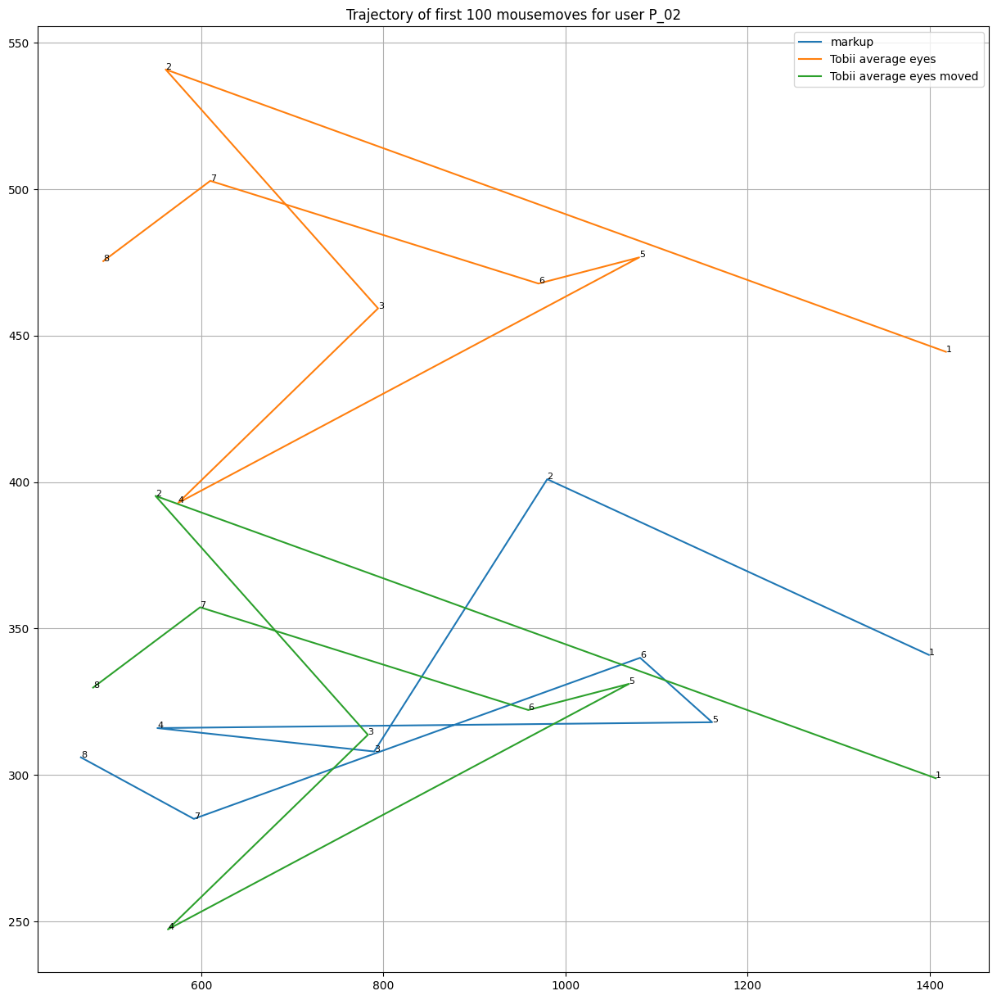

 39%|███████████████████████████████████▏                                                       | 17/44 [00:10<00:14,  1.83it/s]

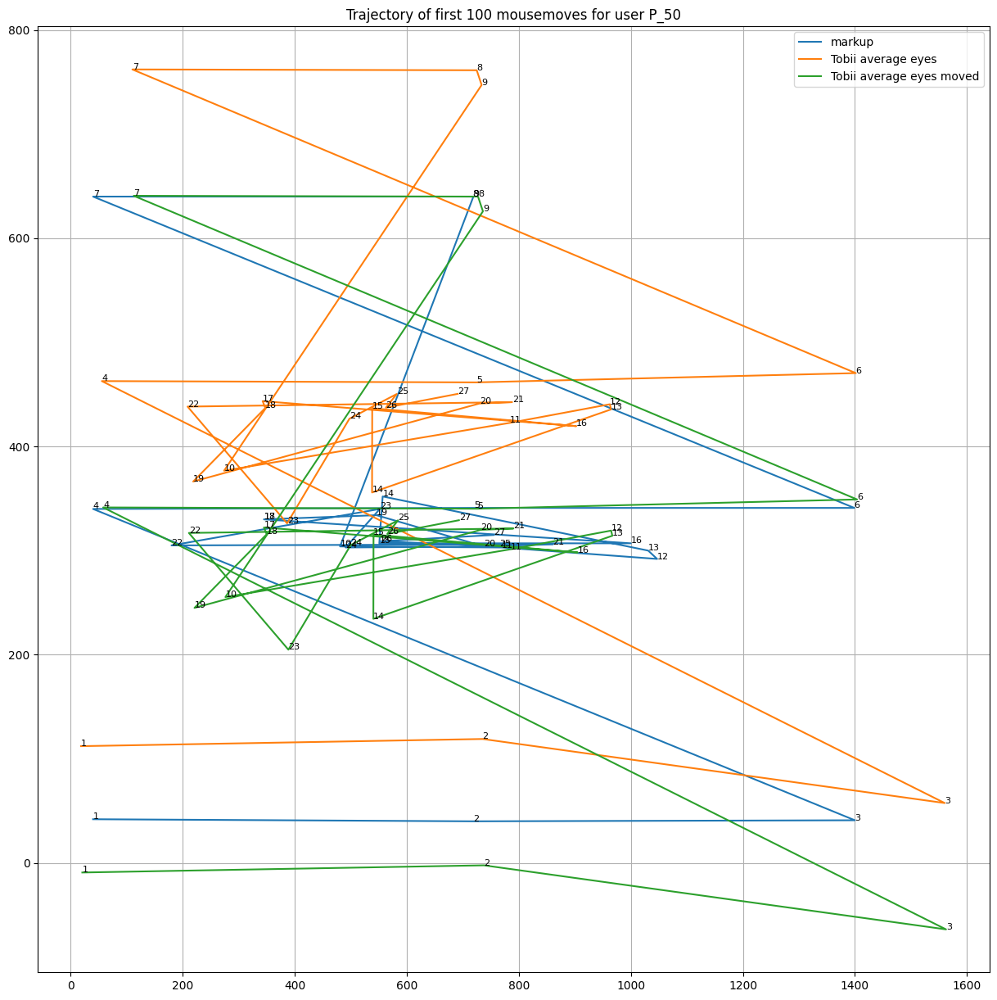

 41%|█████████████████████████████████████▏                                                     | 18/44 [00:10<00:14,  1.75it/s]

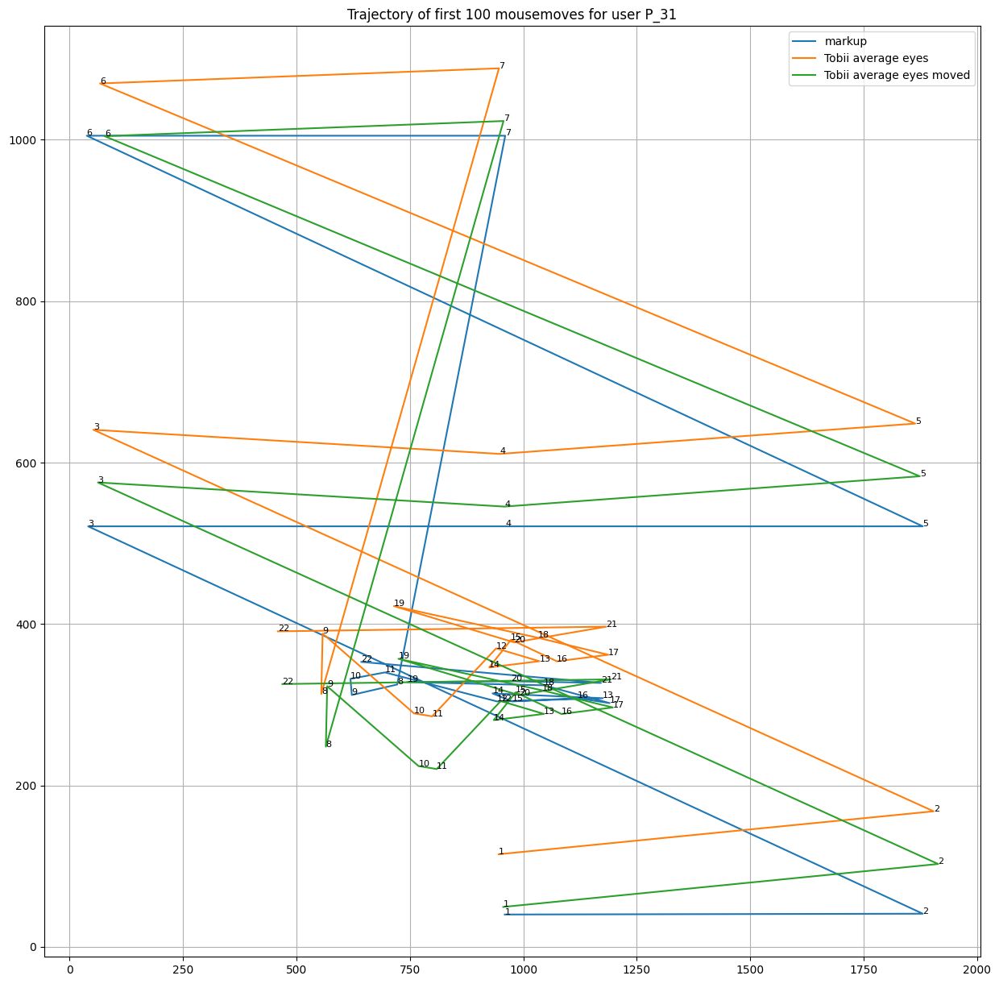

 43%|███████████████████████████████████████▎                                                   | 19/44 [00:11<00:14,  1.71it/s]posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


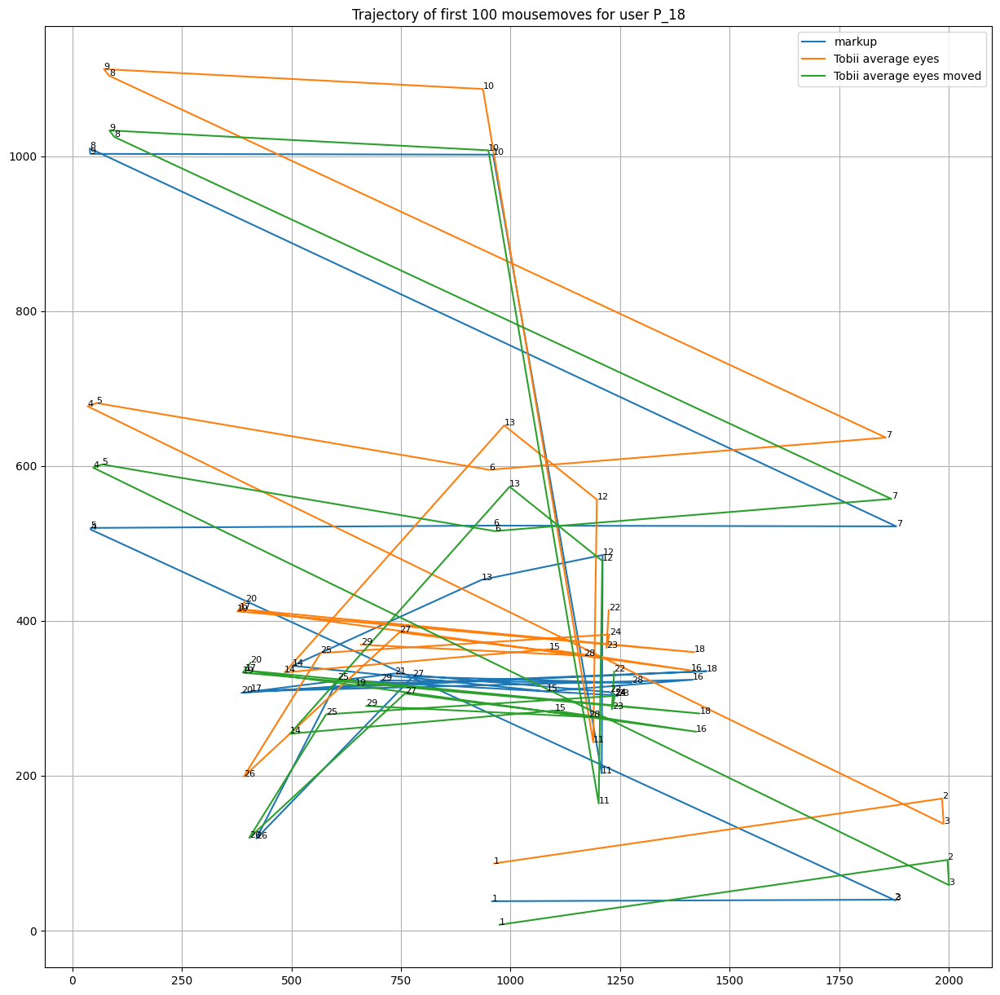

 45%|█████████████████████████████████████████▎                                                 | 20/44 [00:12<00:14,  1.63it/s]

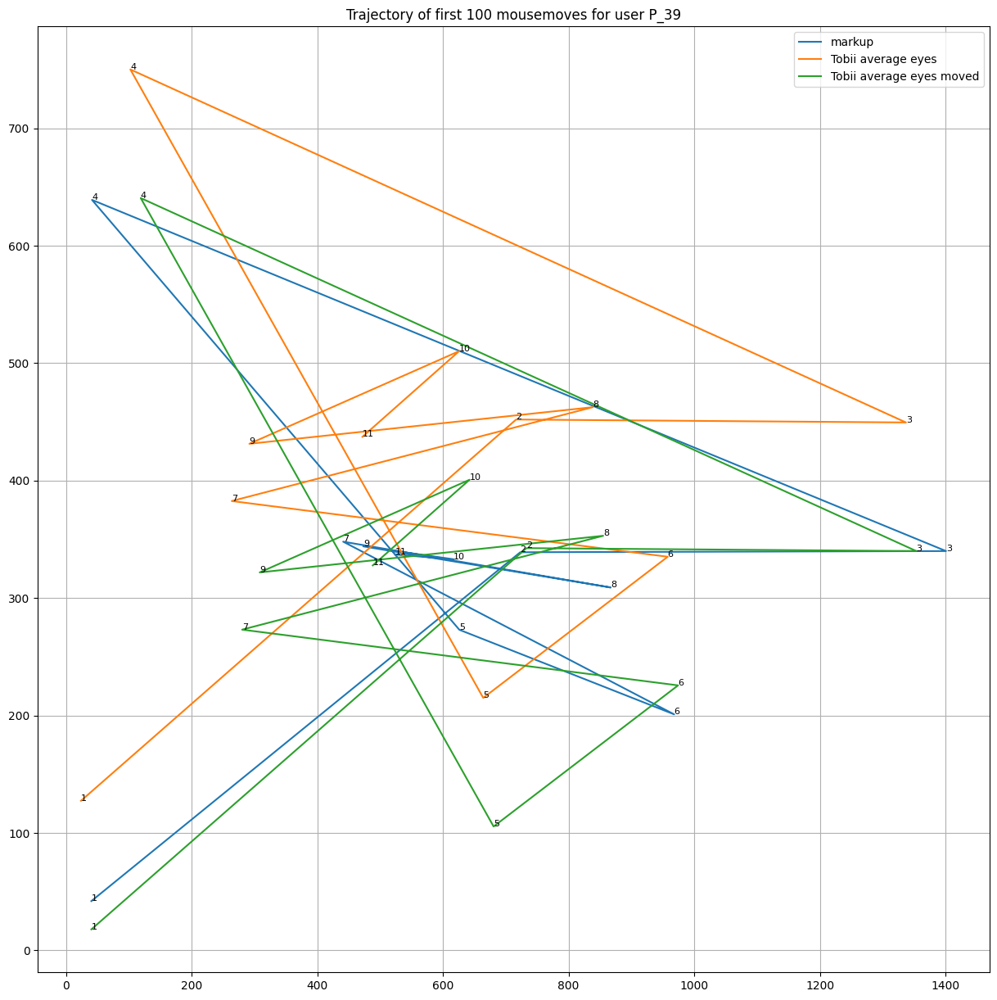

 48%|███████████████████████████████████████████▍                                               | 21/44 [00:12<00:13,  1.68it/s]

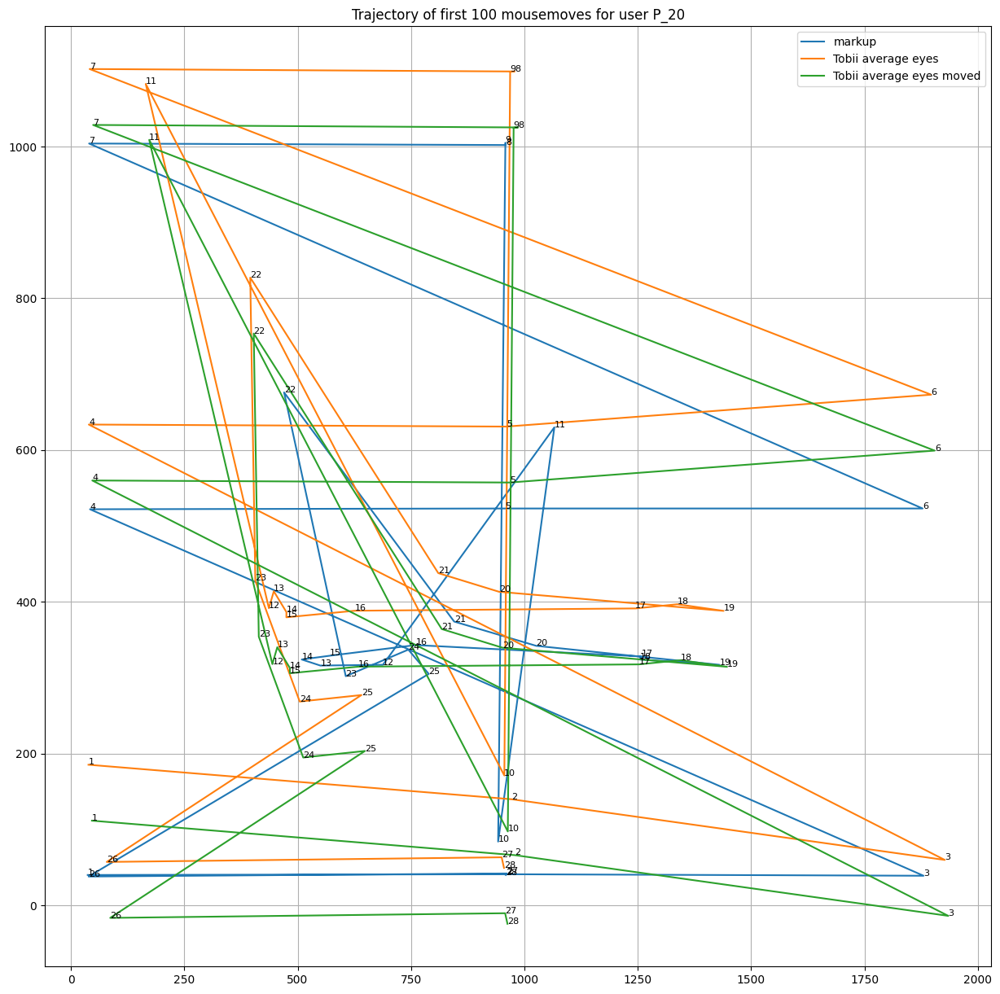

 50%|█████████████████████████████████████████████▌                                             | 22/44 [00:13<00:13,  1.62it/s]

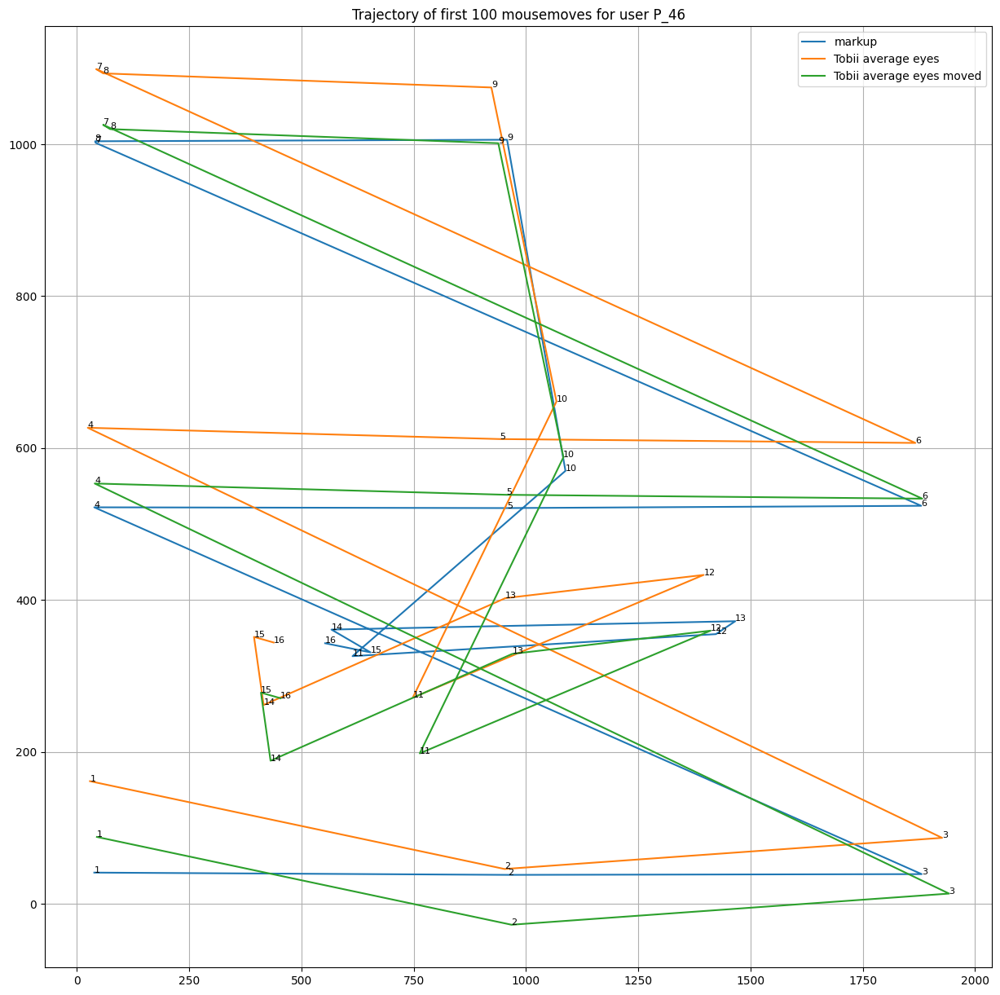

 52%|███████████████████████████████████████████████▌                                           | 23/44 [00:14<00:12,  1.65it/s]posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite value

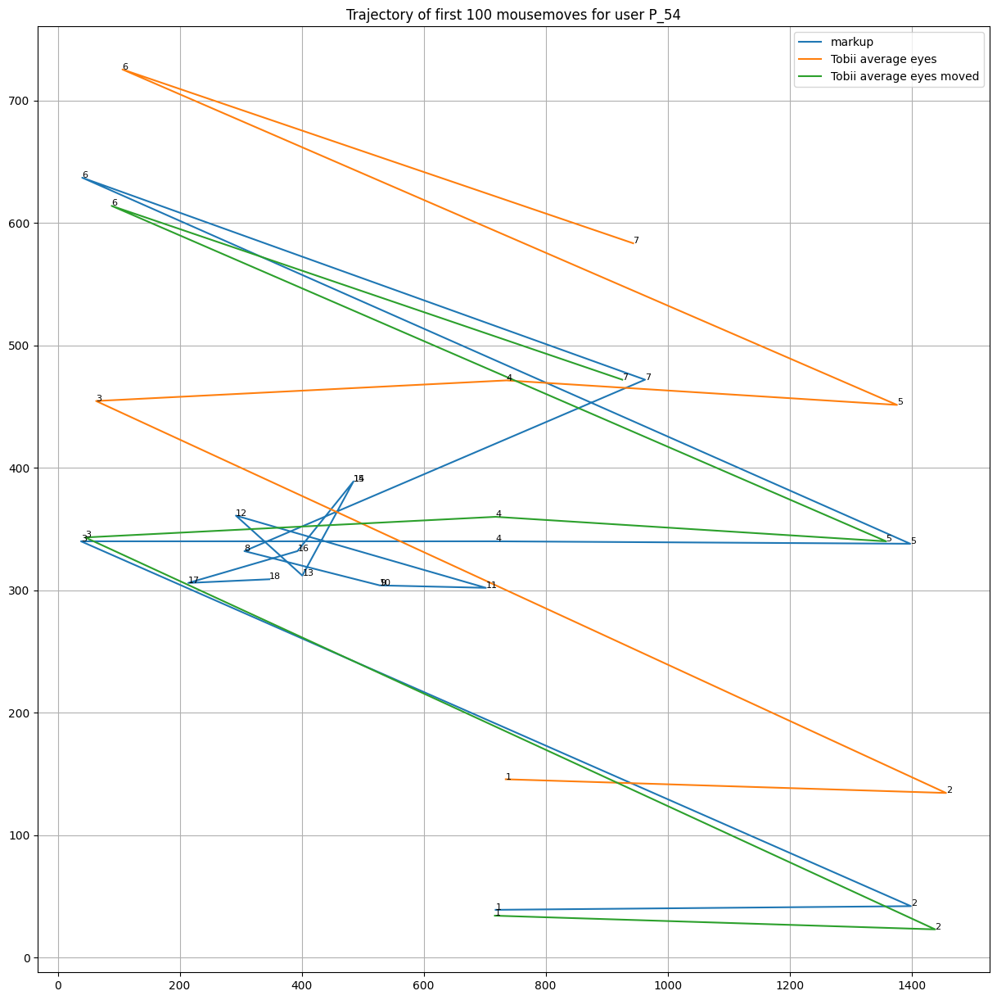

 55%|█████████████████████████████████████████████████▋                                         | 24/44 [00:14<00:12,  1.61it/s]

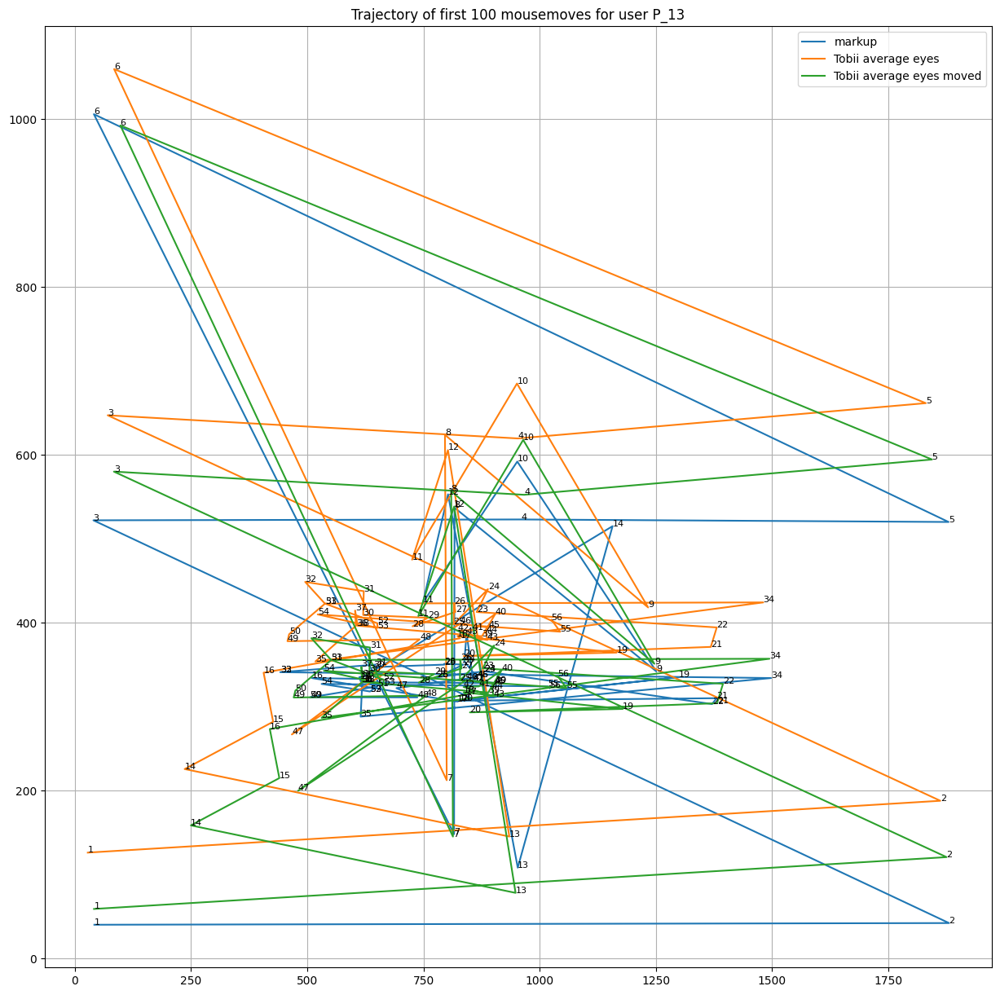

 57%|███████████████████████████████████████████████████▋                                       | 25/44 [00:15<00:13,  1.45it/s]

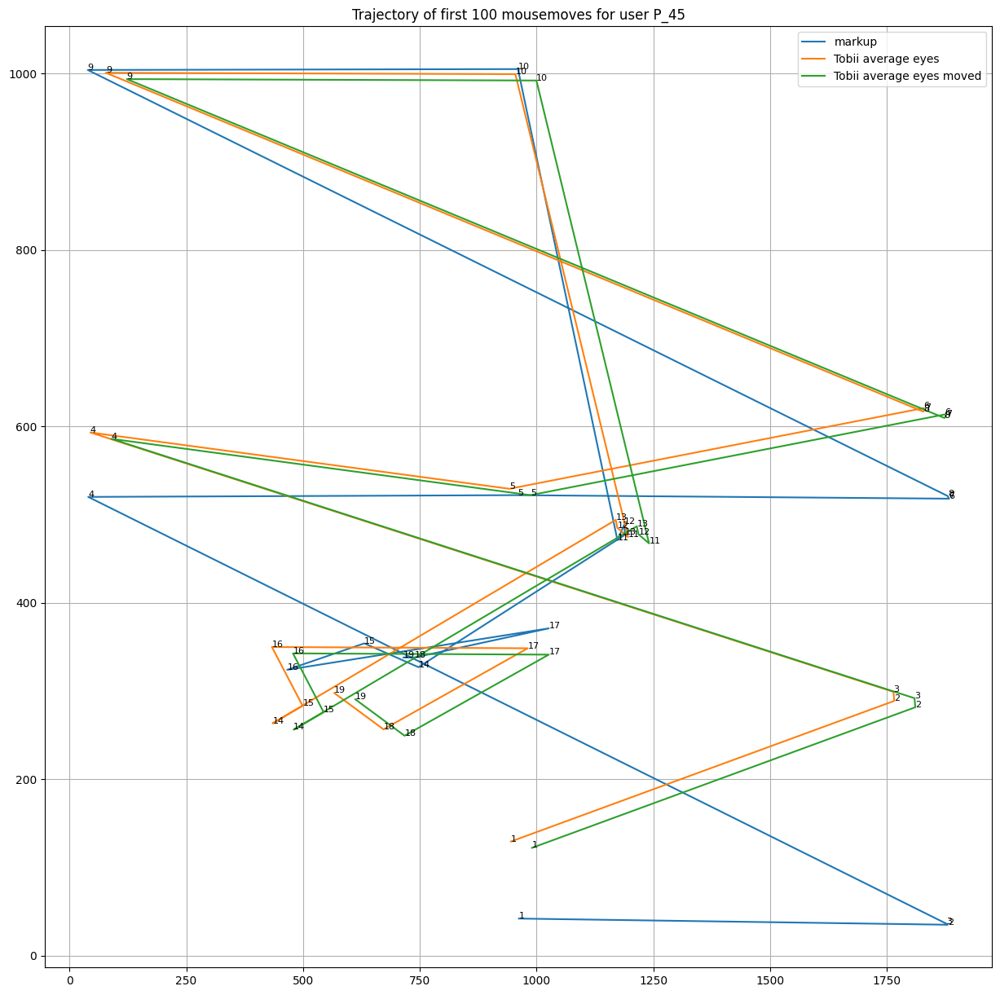

 59%|█████████████████████████████████████████████████████▊                                     | 26/44 [00:16<00:11,  1.51it/s]

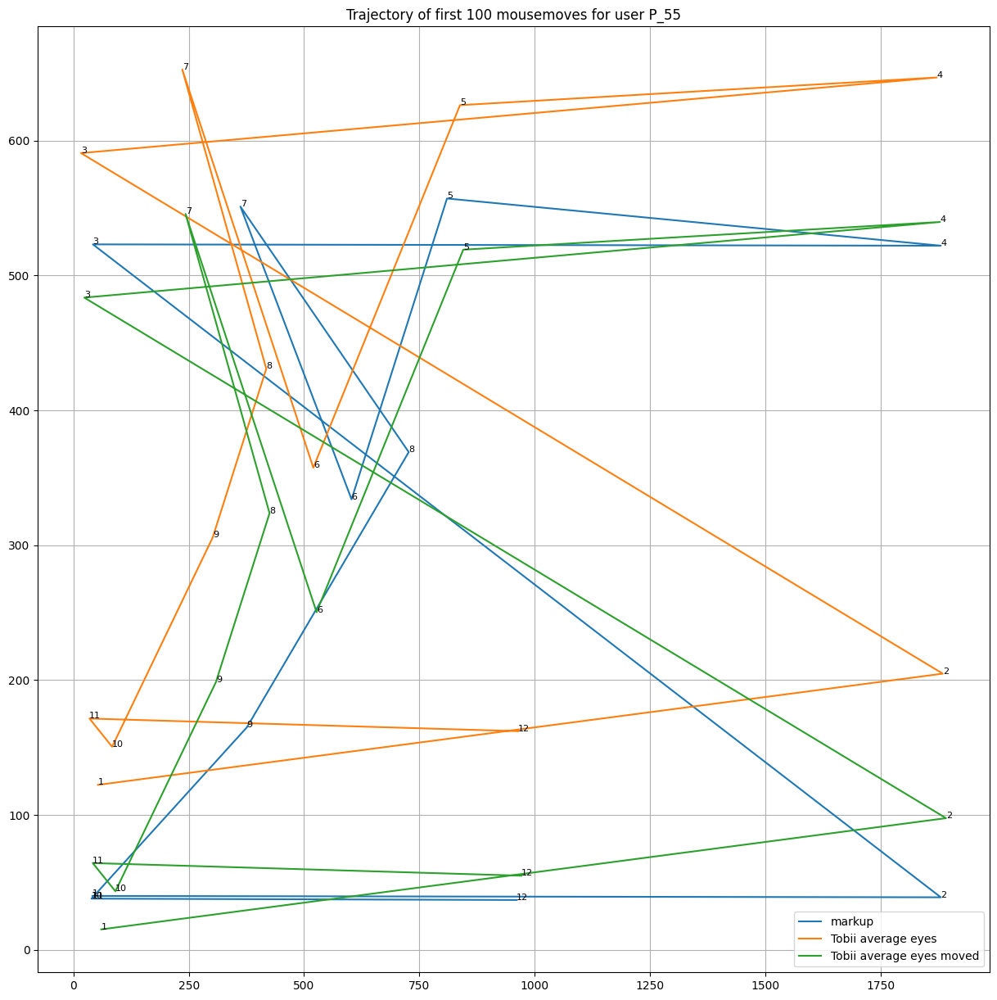

 61%|███████████████████████████████████████████████████████▊                                   | 27/44 [00:16<00:10,  1.59it/s]

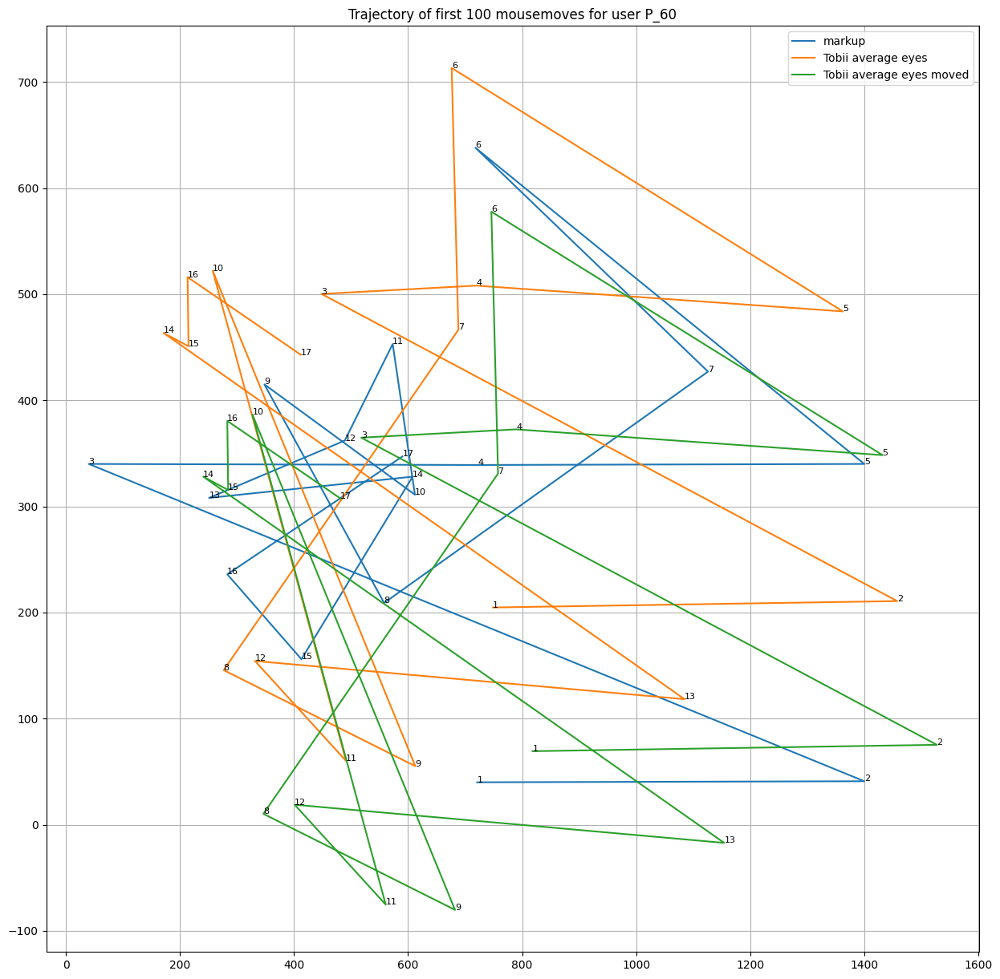

 64%|█████████████████████████████████████████████████████████▉                                 | 28/44 [00:17<00:09,  1.60it/s]

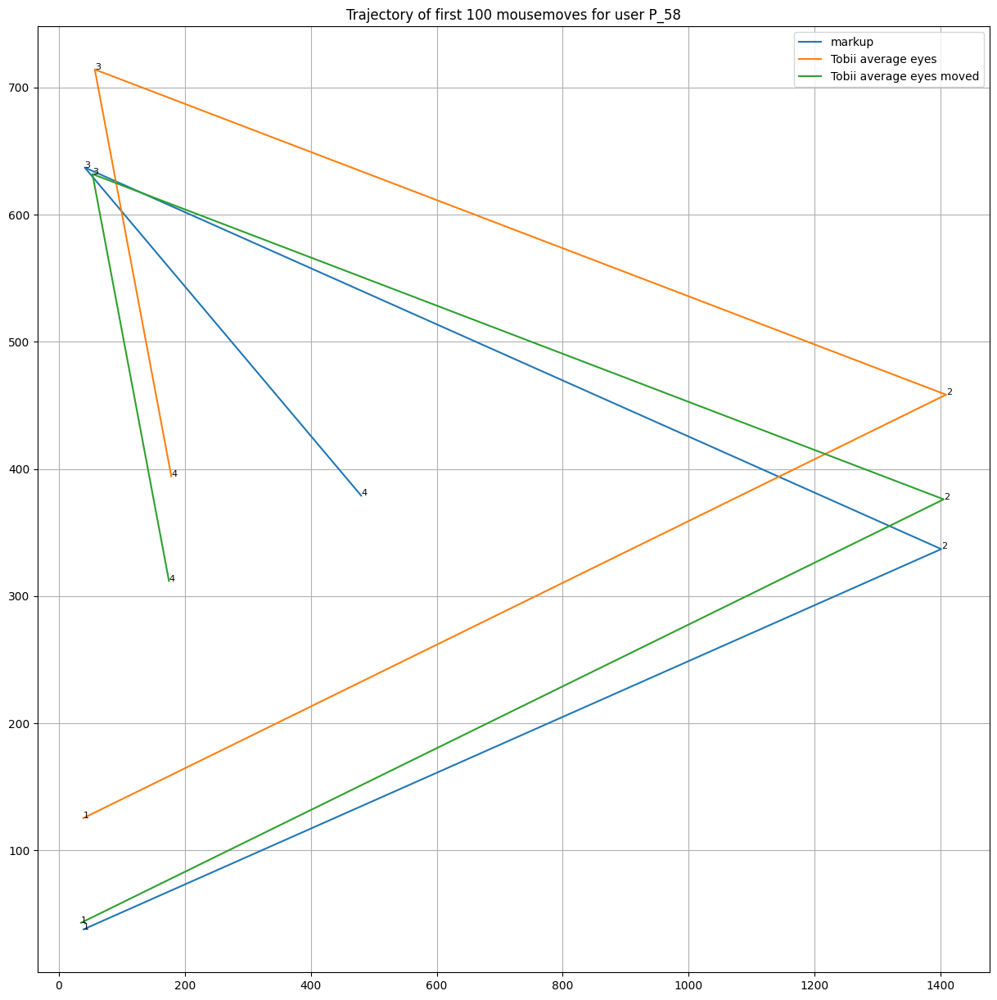

 66%|███████████████████████████████████████████████████████████▉                               | 29/44 [00:17<00:08,  1.72it/s]

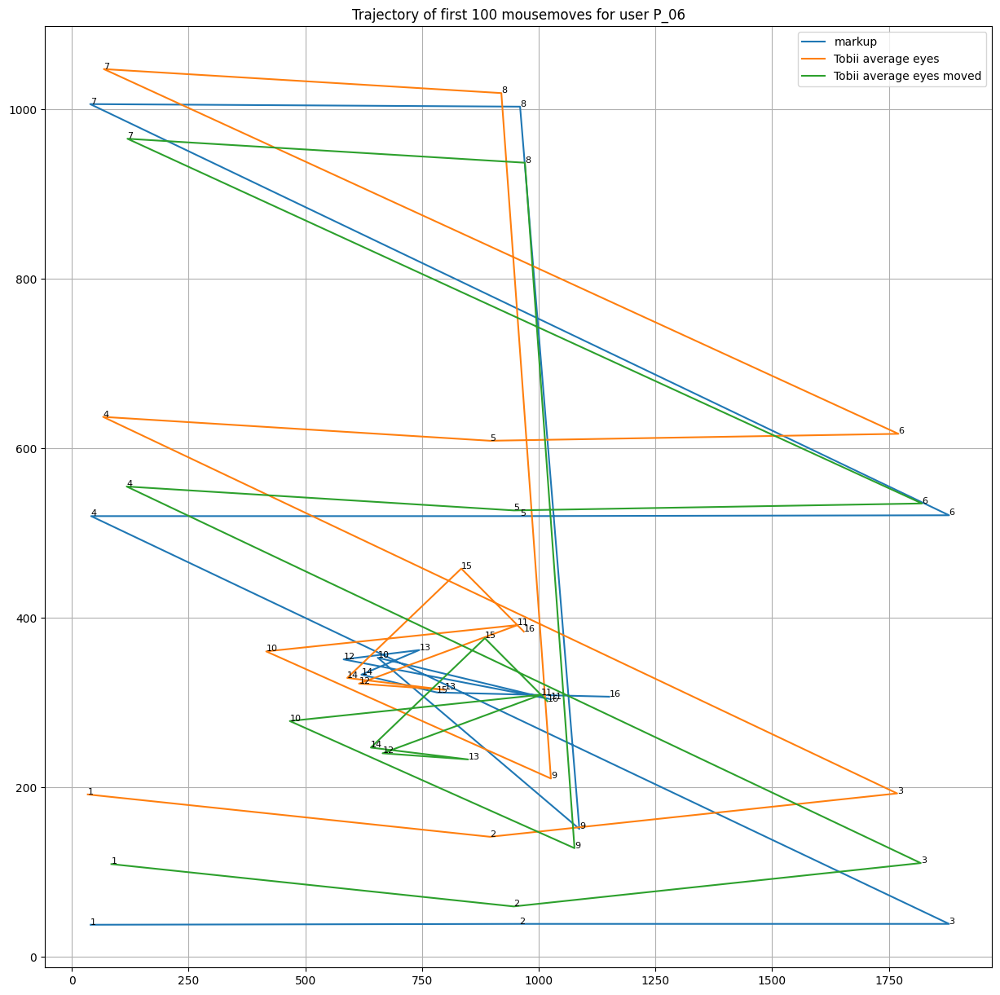

 68%|██████████████████████████████████████████████████████████████                             | 30/44 [00:18<00:08,  1.73it/s]

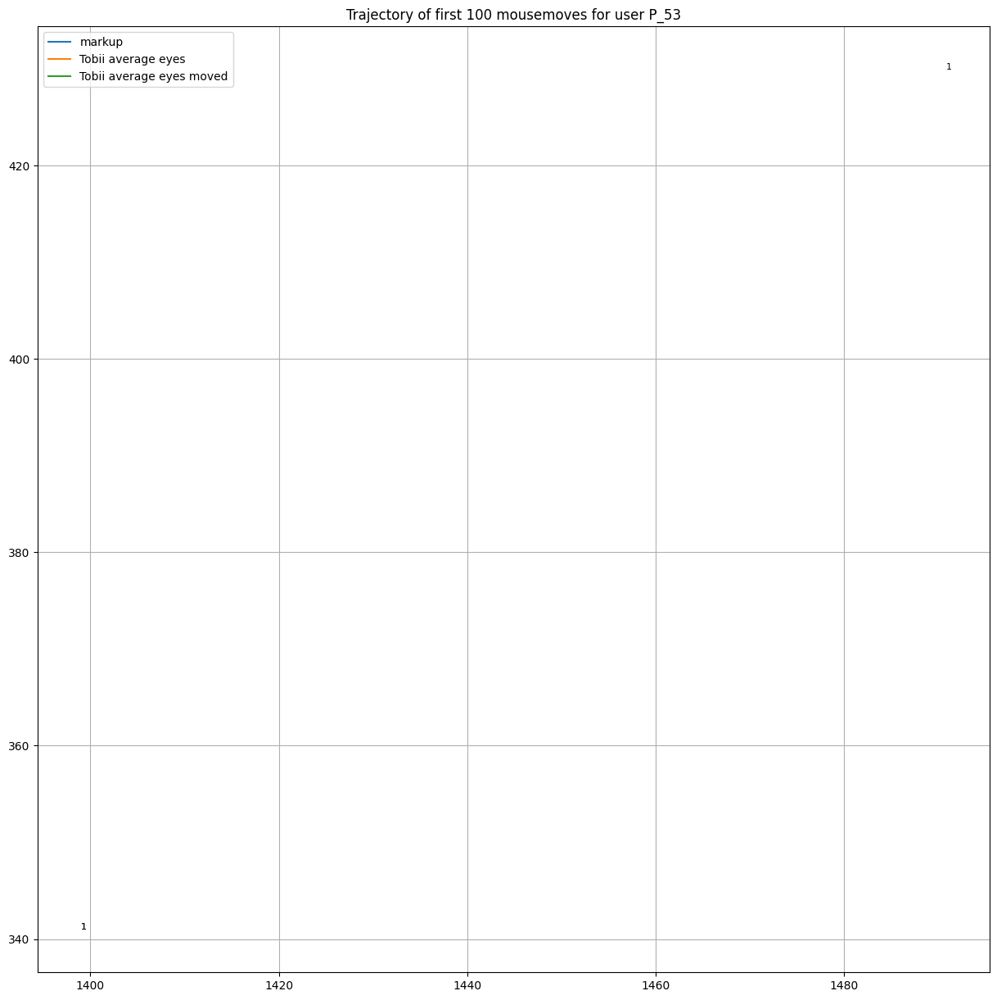

 70%|████████████████████████████████████████████████████████████████                           | 31/44 [00:18<00:06,  1.91it/s]

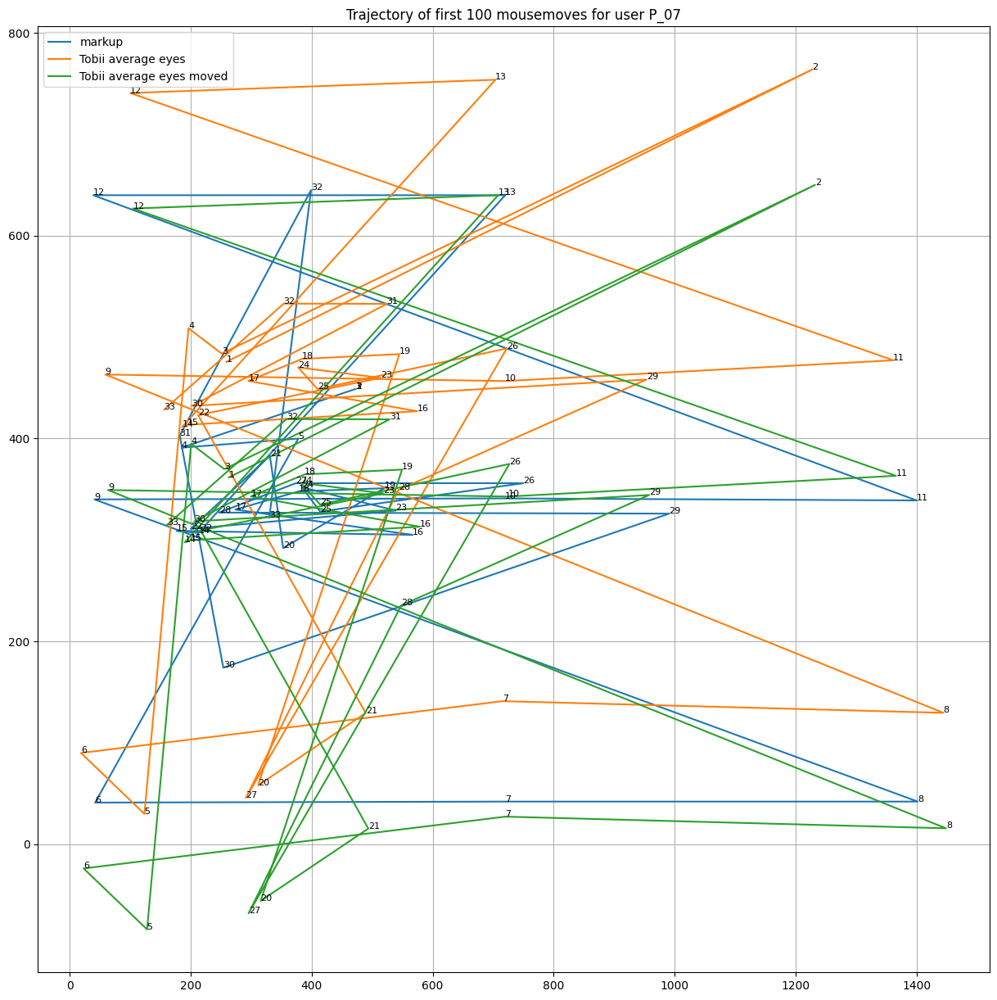

 73%|██████████████████████████████████████████████████████████████████▏                        | 32/44 [00:19<00:06,  1.74it/s]

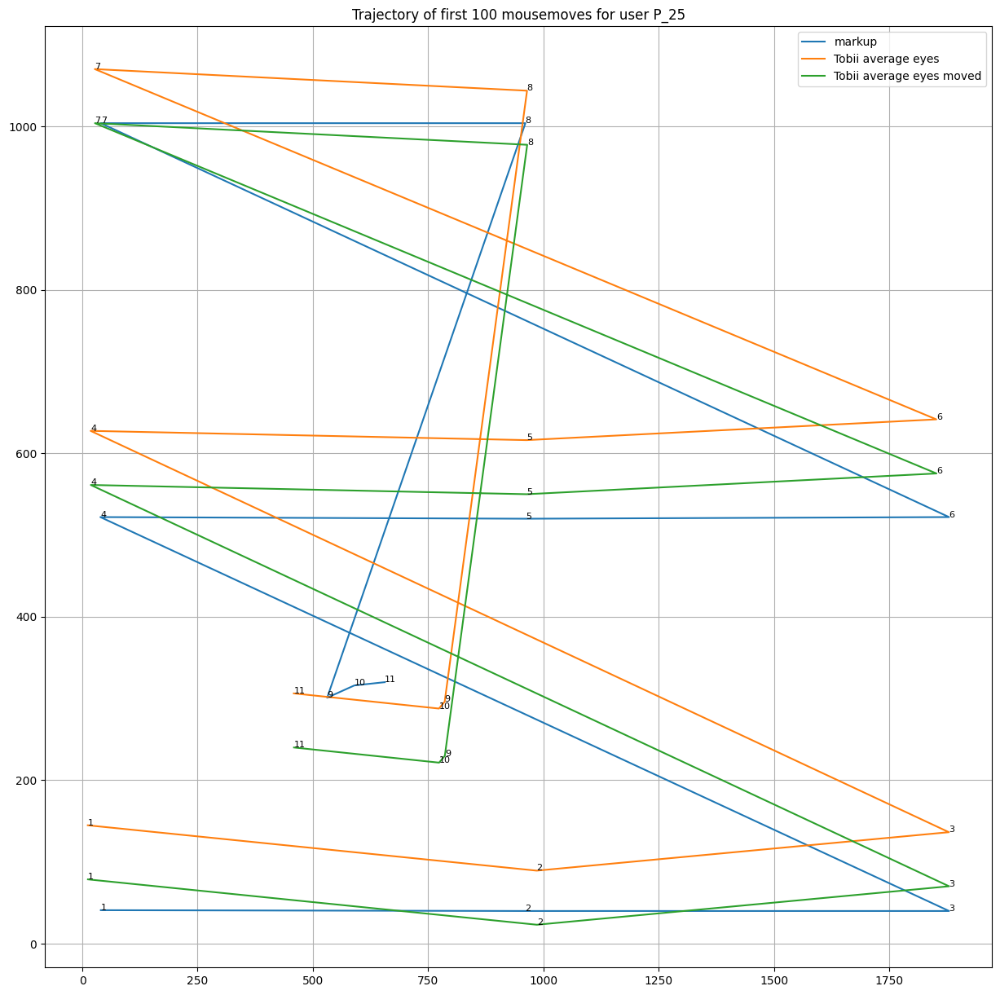

 75%|████████████████████████████████████████████████████████████████████▎                      | 33/44 [00:20<00:07,  1.38it/s]

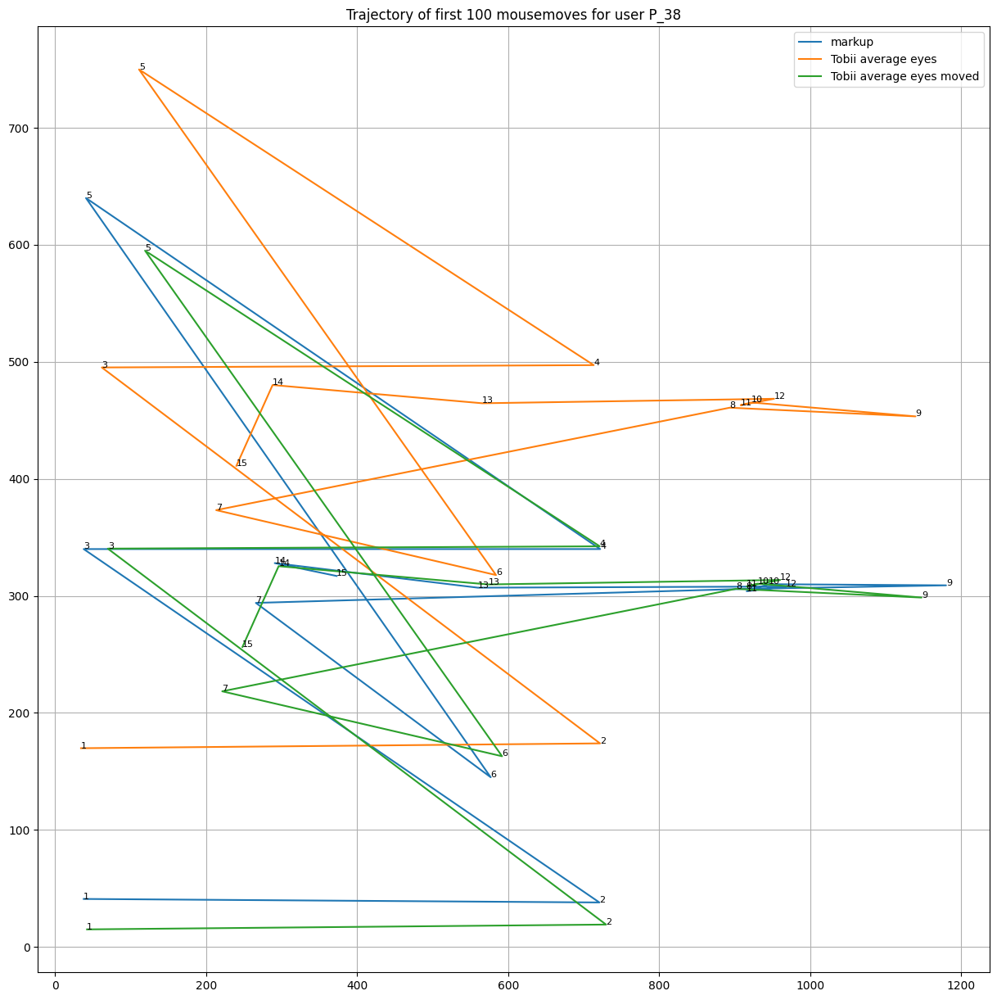

 77%|██████████████████████████████████████████████████████████████████████▎                    | 34/44 [00:21<00:06,  1.47it/s]

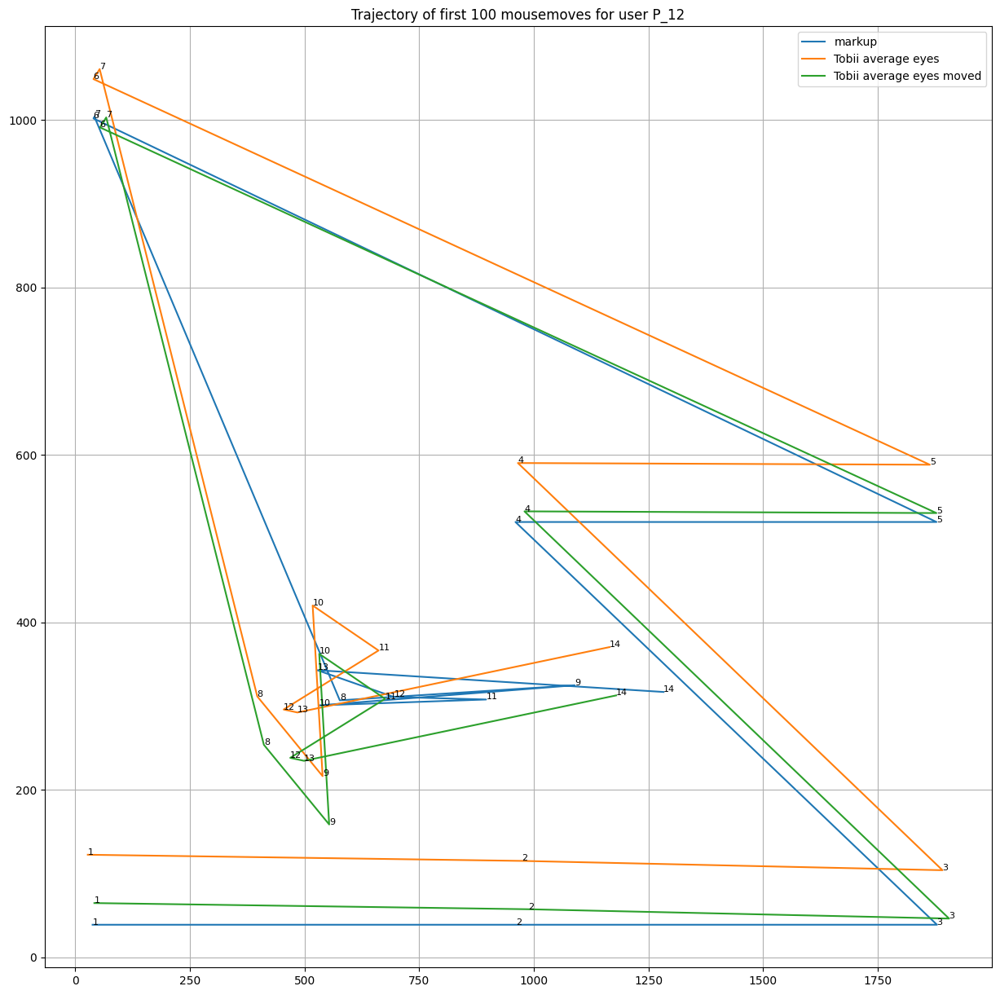

 80%|████████████████████████████████████████████████████████████████████████▍                  | 35/44 [00:21<00:05,  1.56it/s]

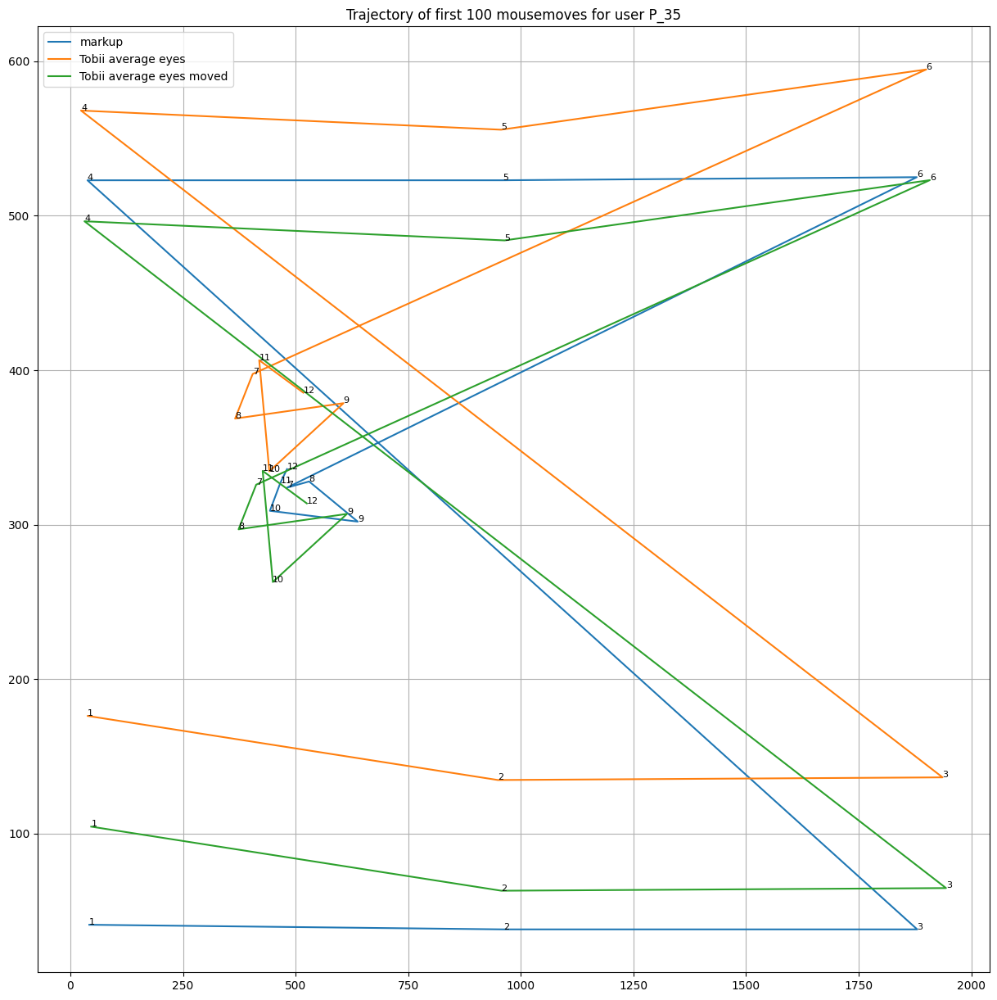

 82%|██████████████████████████████████████████████████████████████████████████▍                | 36/44 [00:22<00:04,  1.63it/s]

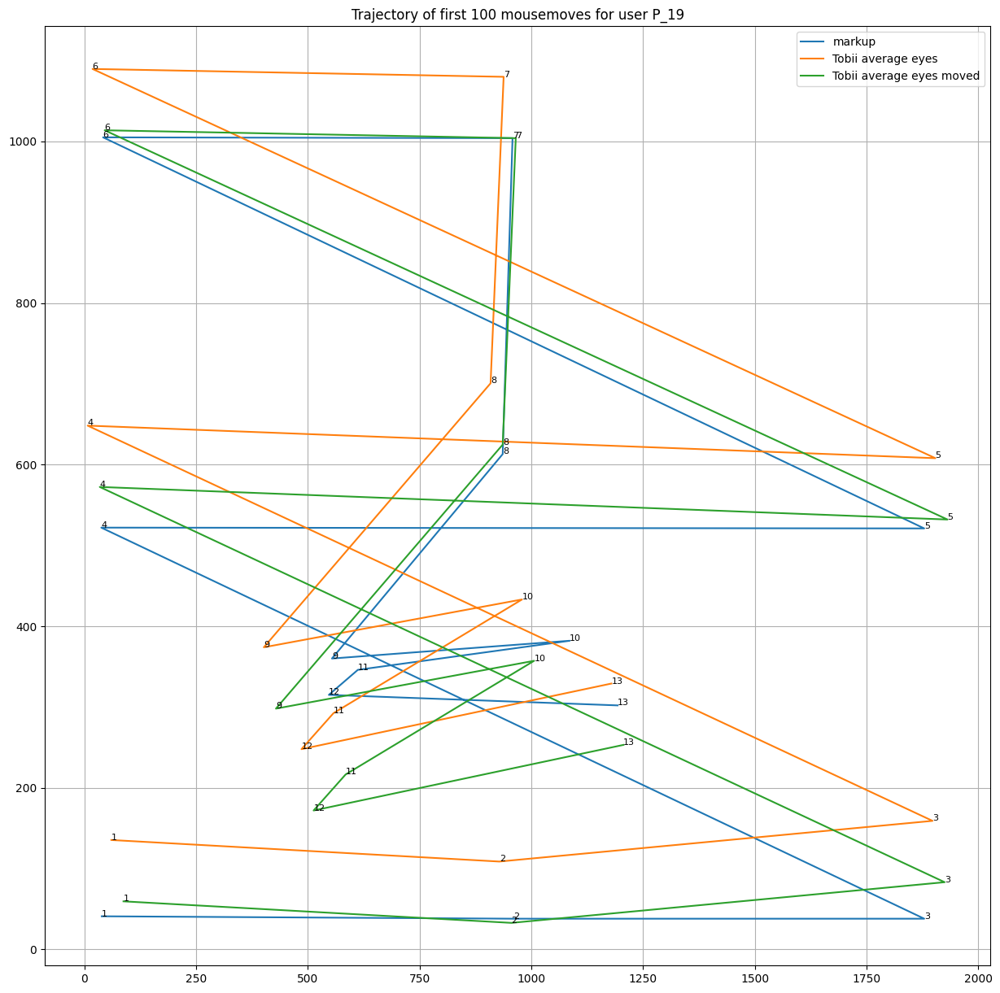

 84%|████████████████████████████████████████████████████████████████████████████▌              | 37/44 [00:22<00:04,  1.67it/s]

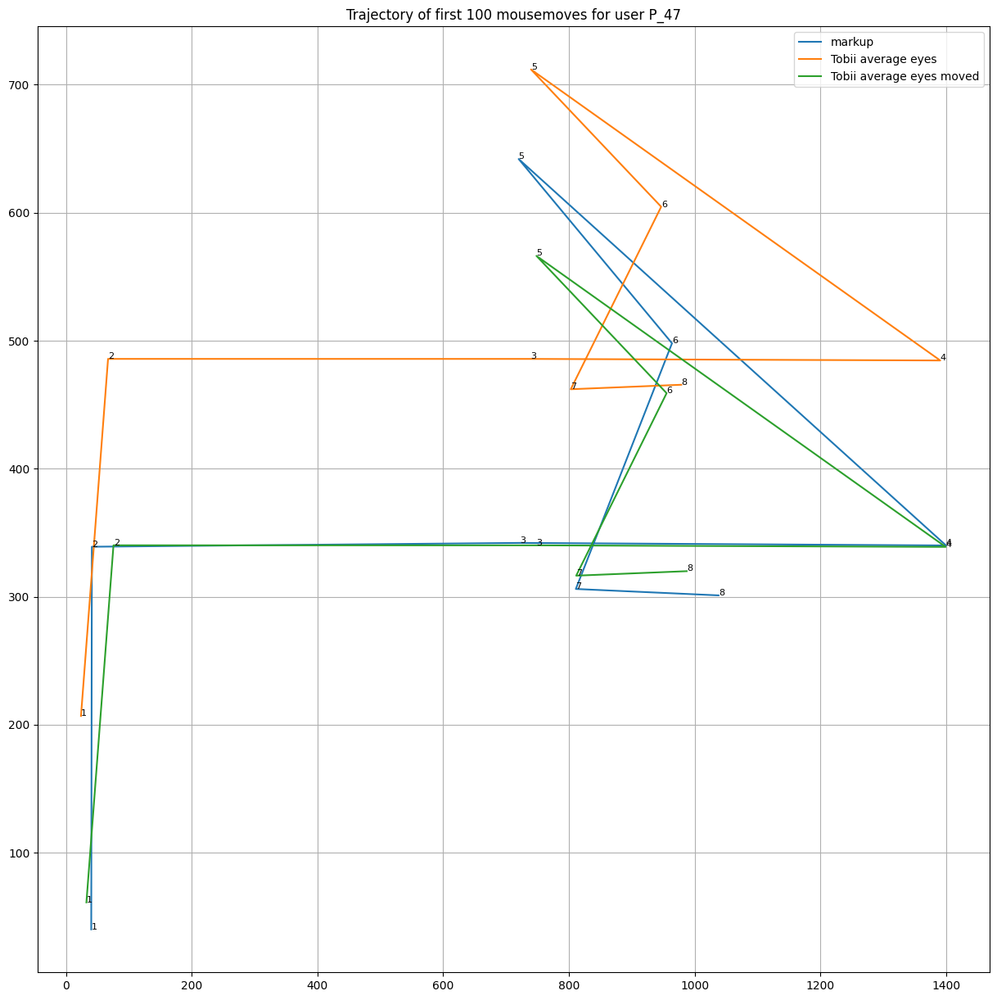

 86%|██████████████████████████████████████████████████████████████████████████████▌            | 38/44 [00:23<00:03,  1.75it/s]

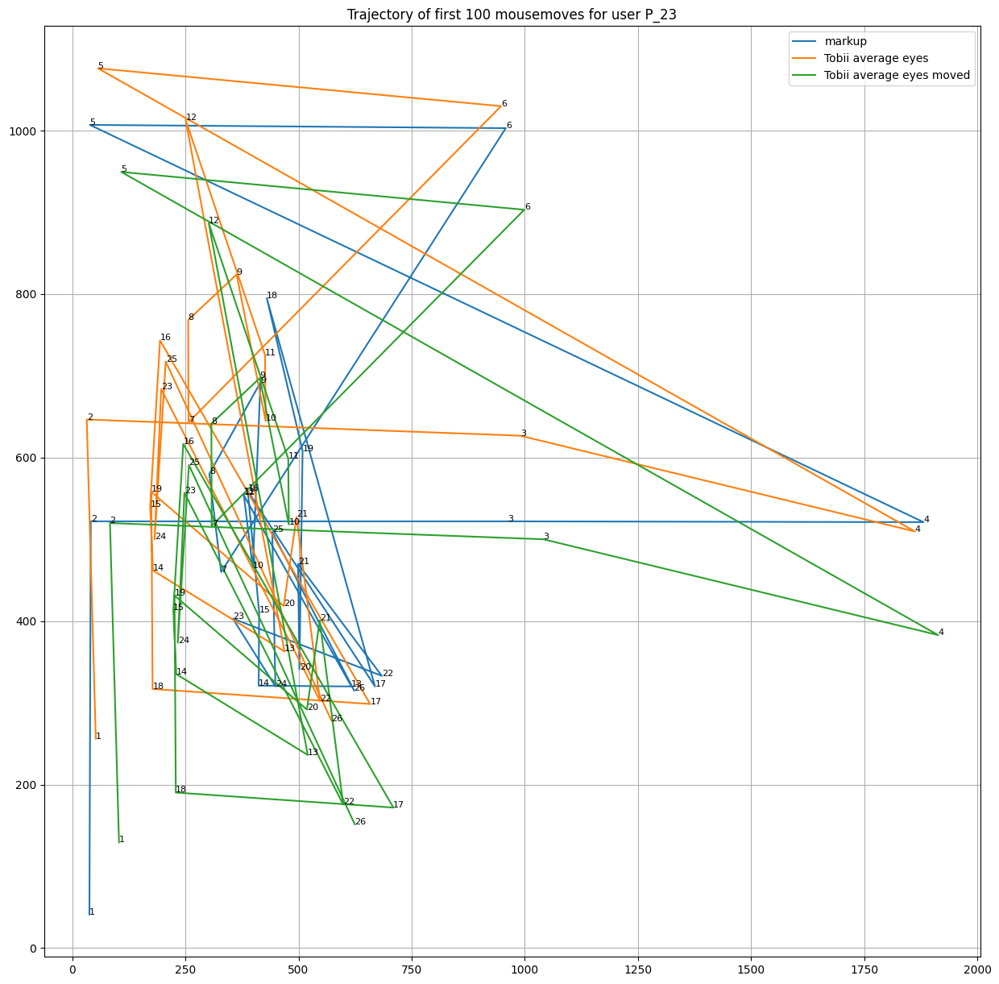

 89%|████████████████████████████████████████████████████████████████████████████████▋          | 39/44 [00:23<00:02,  1.68it/s]

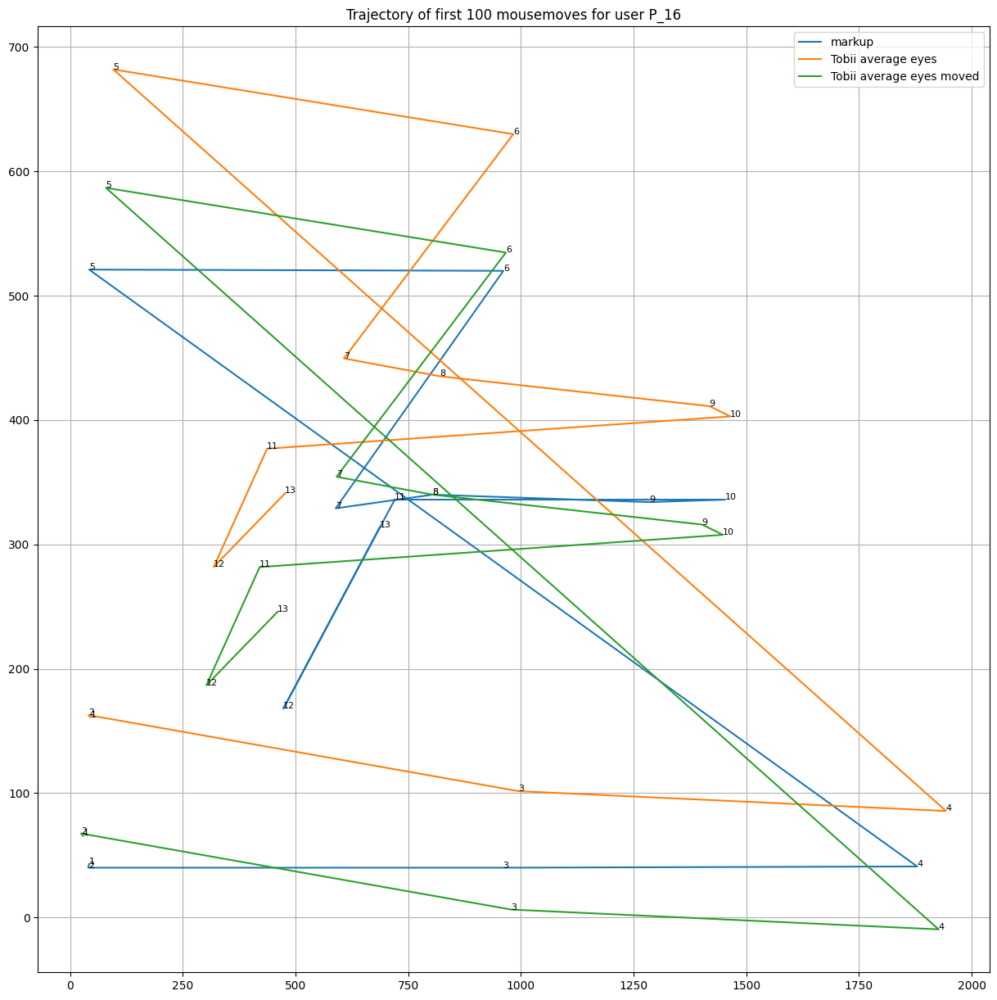

 91%|██████████████████████████████████████████████████████████████████████████████████▋        | 40/44 [00:24<00:02,  1.70it/s]

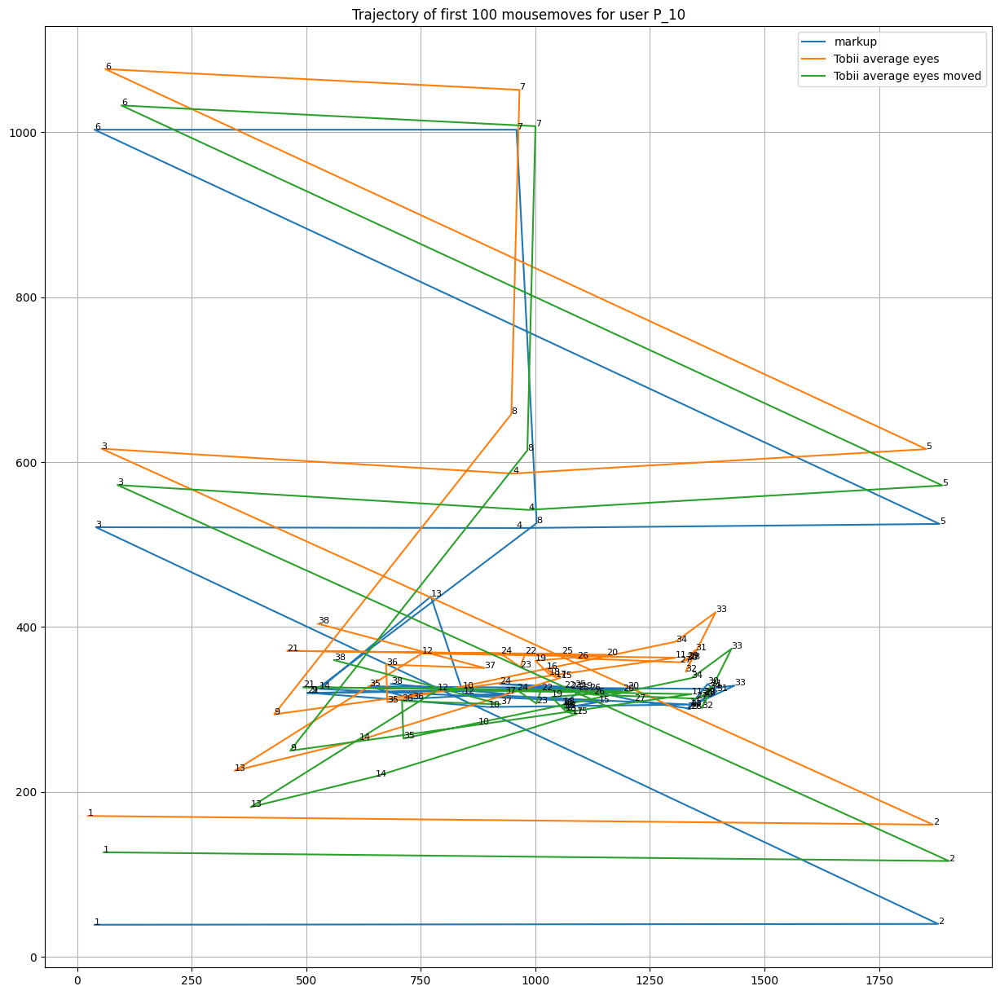

 93%|████████████████████████████████████████████████████████████████████████████████████▊      | 41/44 [00:25<00:01,  1.59it/s]

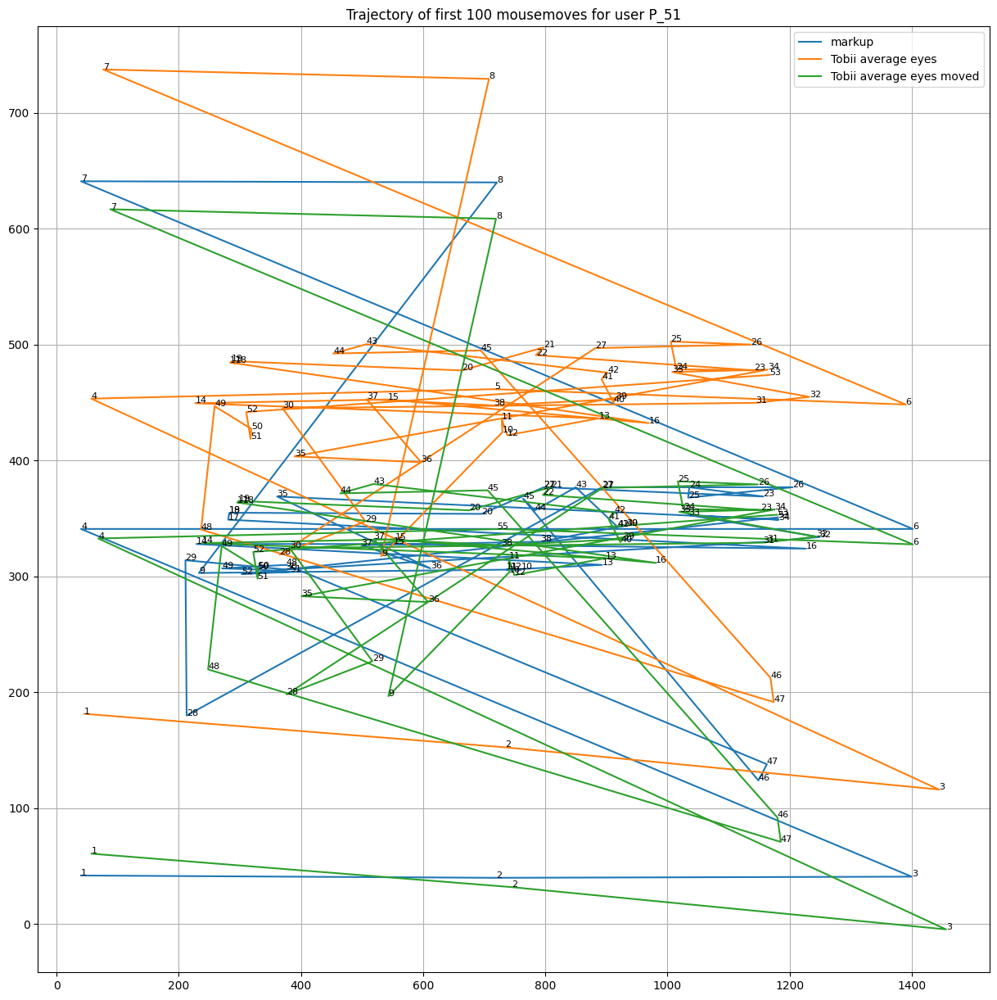

 95%|██████████████████████████████████████████████████████████████████████████████████████▊    | 42/44 [00:26<00:01,  1.43it/s]

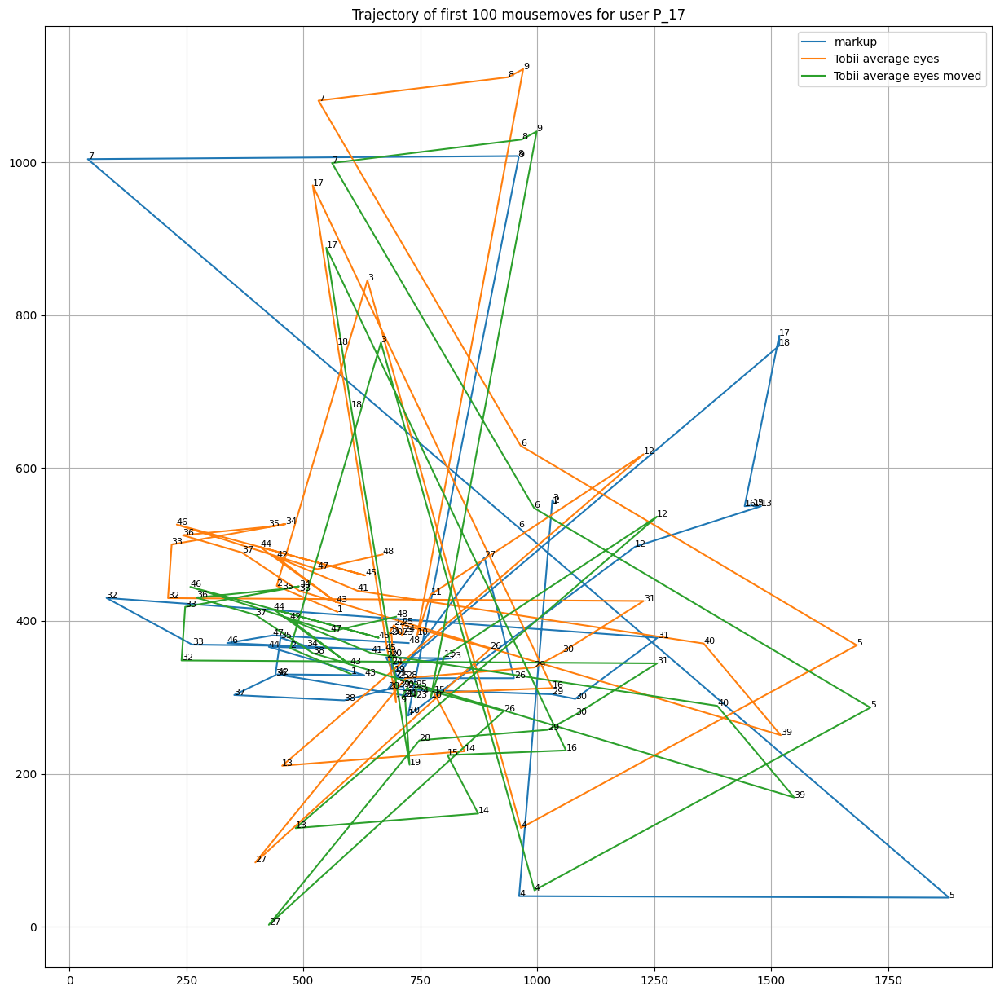

 98%|████████████████████████████████████████████████████████████████████████████████████████▉  | 43/44 [00:26<00:00,  1.36it/s]

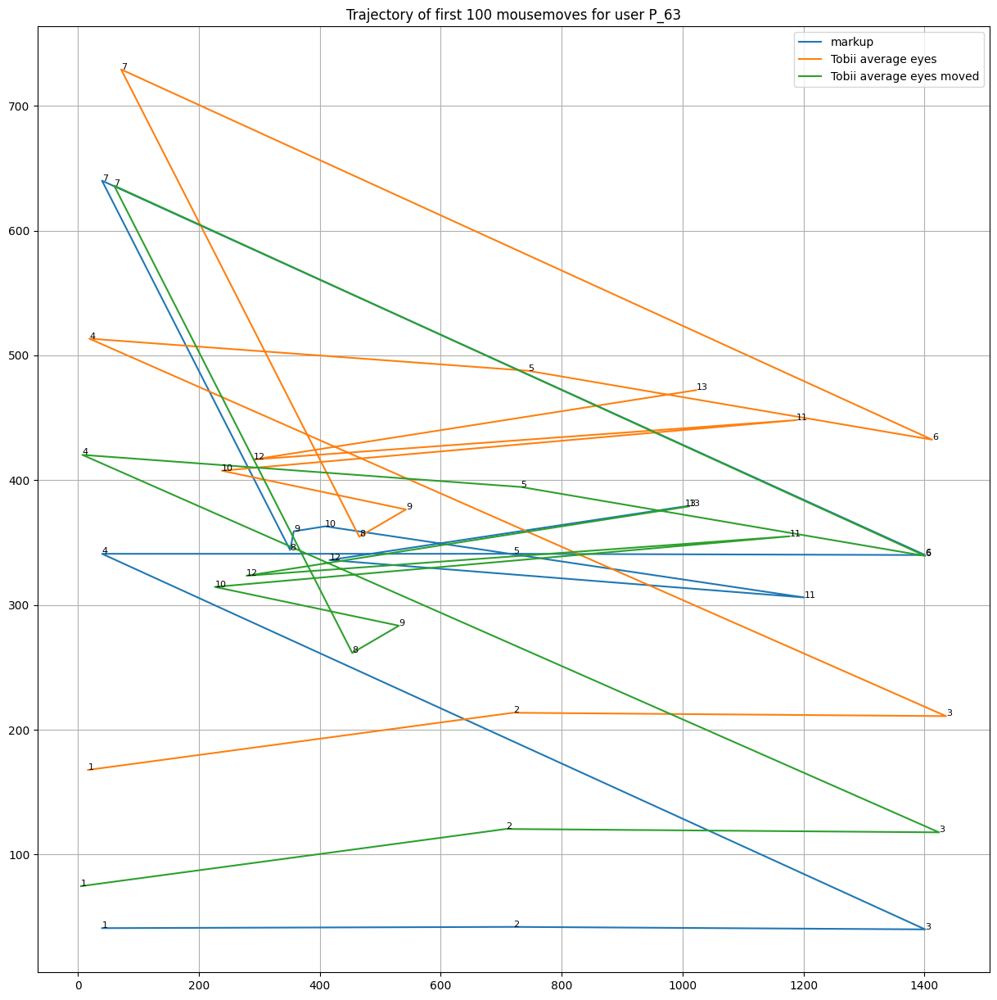

100%|███████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:27<00:00,  1.60it/s]


In [234]:
mean_distances = []
std_distances = []
mean_dt = []
std_dt = []
for user in tqdm(full_df.user.unique()):
    df_user = full_df[full_df["user"] == user].sort_values("timestamps")
    
    df_user_matched = df_user[(~df_user["clientX"].isna())]
    df_user_matched = df_user_matched[df_user_matched["type"] == "mouseclick"]
    df_user_matched["tob_x"] = (df_user_matched["tob_right_x"] + df_user_matched["tob_left_x"]) / 2 * df_user_matched["display_width"]
    
    df_user_matched["tob_y"] = (df_user_matched["tob_right_y"] + df_user_matched["tob_left_y"]) / 2 * df_user_matched["display_height"]
    
    df_user_matched["distance"] = df_user_matched[["clientX", "clientY", "tob_x", "tob_y"]].apply(lambda x: distance(*x), axis = 1)
    df_user_matched["distance_x"] = df_user_matched[["clientX", "clientY", "tob_x", "tob_y"]].apply(lambda x:
                                                                                                    distance(x[0], 0, x[2], 0), axis = 1)
    df_user_matched["distance_y"] = df_user_matched[["clientX", "clientY", "tob_x", "tob_y"]].apply(lambda x:
                                                                                                    distance(0, x[1], 0, x[3]), axis = 1)
    df_user_matched["dt"] = (df_user_matched["timestamps"] - df_user_matched["tob_timestamps"]).abs()
    df_user_matched = df_user_matched[df_user_matched["validity"]]
    mean_dist = df_user_matched['distance'].mean()
    med_dist_x = (df_user_matched['tob_x'] - df_user_matched['clientX']).median()
    med_dist_y = (df_user_matched['tob_y'] - df_user_matched['clientY']).median()
    mean_distances.append(mean_dist)
    std_distances.append(df_user_matched['distance'].std())
    mean_dt.append(df_user_matched['dt'].mean())
    std_dt.append(df_user_matched['dt'].std())
    
    fig, ax = plt.subplots(figsize = (15, 15))
    ax.set_title(f"Trajectory of first 100 mousemoves for user {user}")
    ax.plot(df_user_matched["clientX"], df_user_matched["clientY"], label = "markup")
    ax.plot(df_user_matched["tob_x"], df_user_matched["tob_y"], label = "Tobii average eyes")
    ax.plot(df_user_matched["tob_x"] - med_dist_x, df_user_matched["tob_y"] - med_dist_y, label = "Tobii average eyes moved")
    for i in range(df_user_matched.shape[0]):
        ax.text(df_user_matched["clientX"].values[i], df_user_matched["clientY"].values[i], f"{i + 1}", fontsize=8)
    for i in range(df_user_matched.shape[0]):
        ax.text(df_user_matched["tob_x"].values[i], df_user_matched["tob_y"].values[i], f"{i + 1}", fontsize=8)
    for i in range(df_user_matched.shape[0]):
        ax.text((df_user_matched["tob_x"] - med_dist_x).values[i], (df_user_matched["tob_y"] - med_dist_y).values[i], f"{i + 1}", fontsize=8)
    plt.legend()
    plt.grid()
    plt.savefig(f"./plot_clicks/{user}.pdf")
    plt.show();

### moves

In [232]:
np.mean(mean_distances)

269.3441311733029

In [233]:
np.mean(mean_dt)

12.234230015836191

### clicks

In [224]:
np.mean(mean_distances)

153.49389065372205

In [225]:
np.mean(mean_dt)

12.109591184526579

## Prepare df for extracting features

In [24]:
import os

In [20]:
df_clicks = full_df[full_df["type"] == "mouseclick"]

In [27]:
df_clicks["paths"] = df_clicks["paths"].apply(lambda x: os.path.join("/home/newuser/data", x[2:]))

In [31]:
df_clicks[["paths", "x_normalized", "y_normalized"]].to_csv("./data_clicks.csv", index = False)

## Visual exam of Tobii coordinates

In [24]:
tob_df["tob_x"] = (tob_df["tob_right_x"] + tob_df["tob_left_x"]) / 2 * tob_df["display_width"]
tob_df["tob_y"] = (tob_df["tob_right_y"] + tob_df["tob_left_y"]) / 2 * tob_df["display_height"]

In [34]:
random_indices  = np.random.randint(0, tob_df.shape[0] - 1, 10)
random_indices

array([435968, 192572, 229721, 570312, 233111, 416777,  85229, 399012,
       539200, 610343])

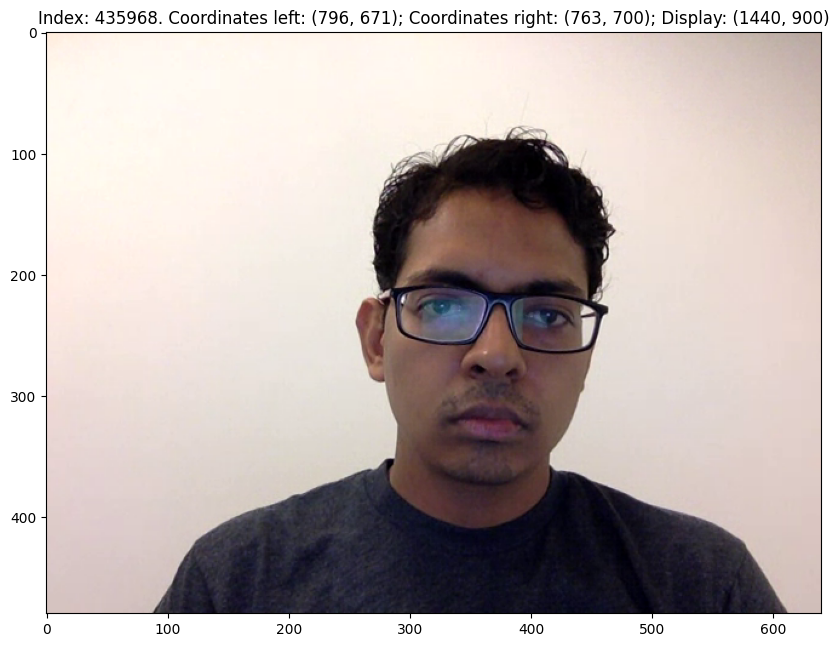

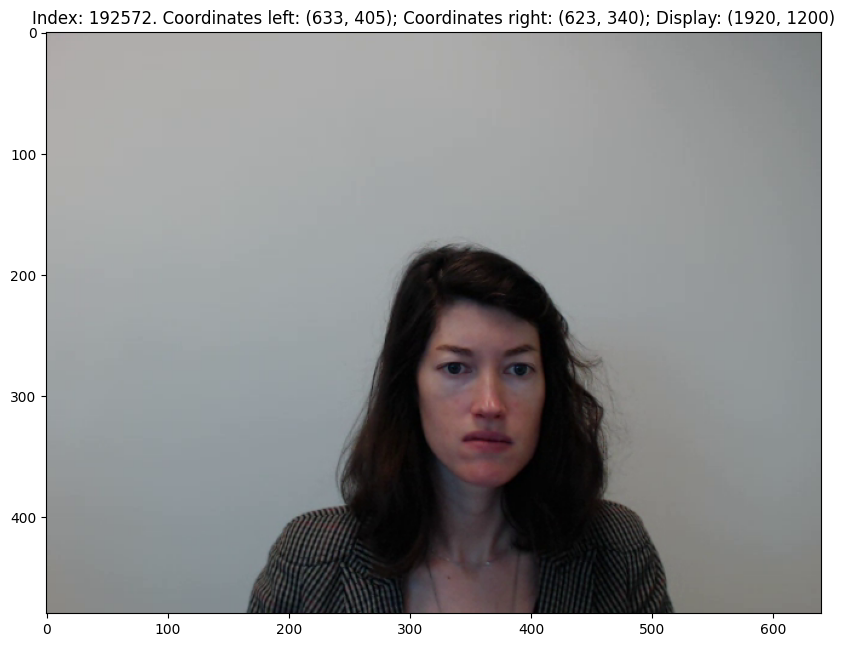

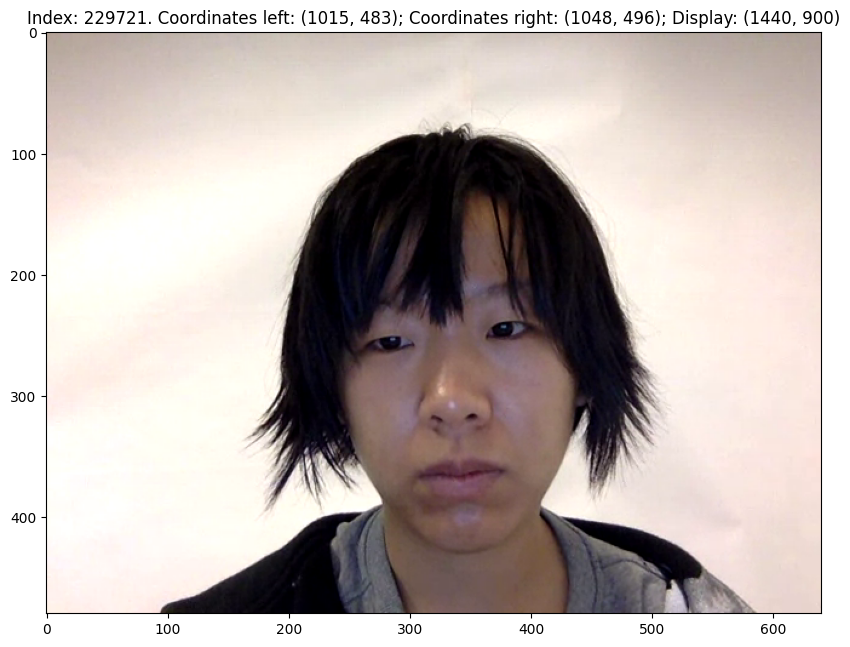

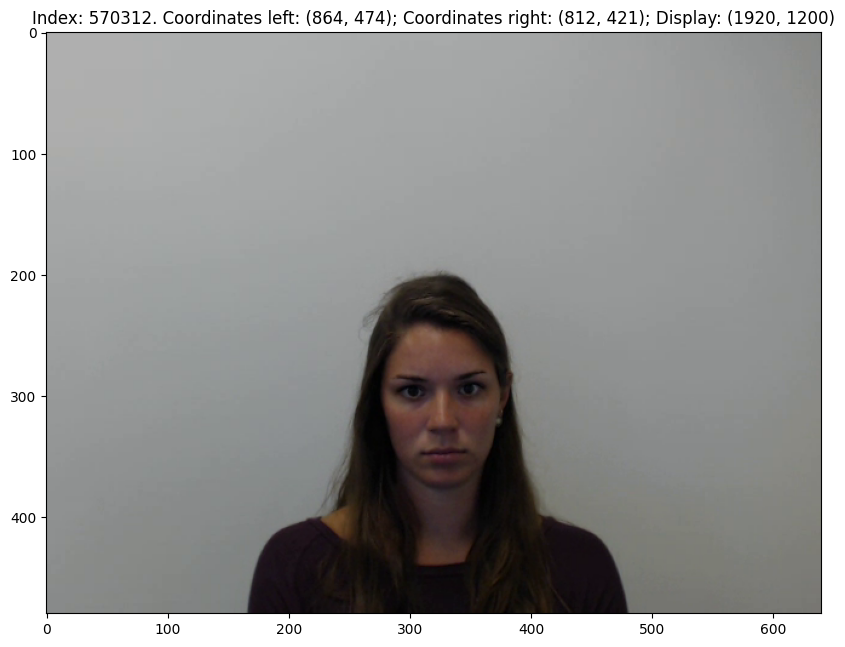

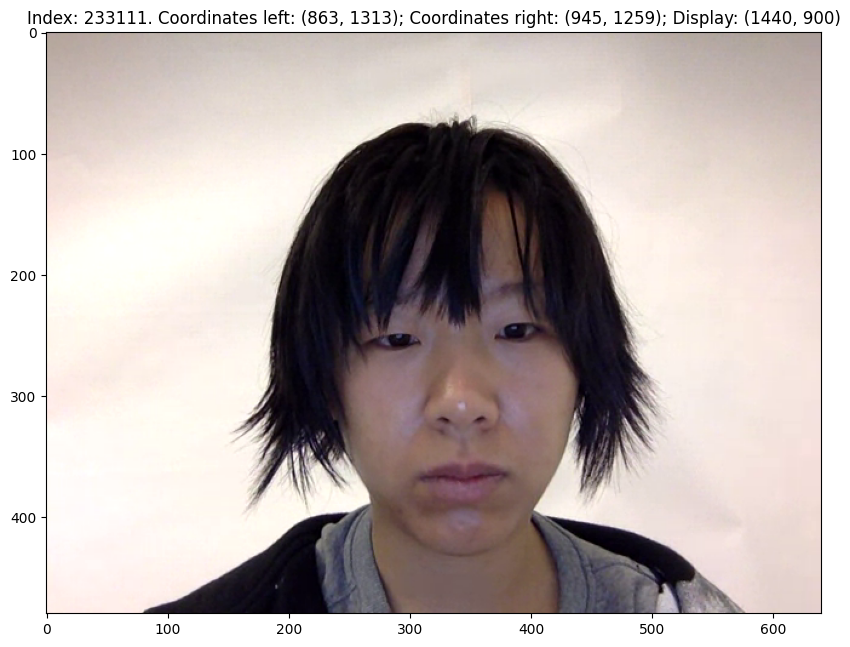

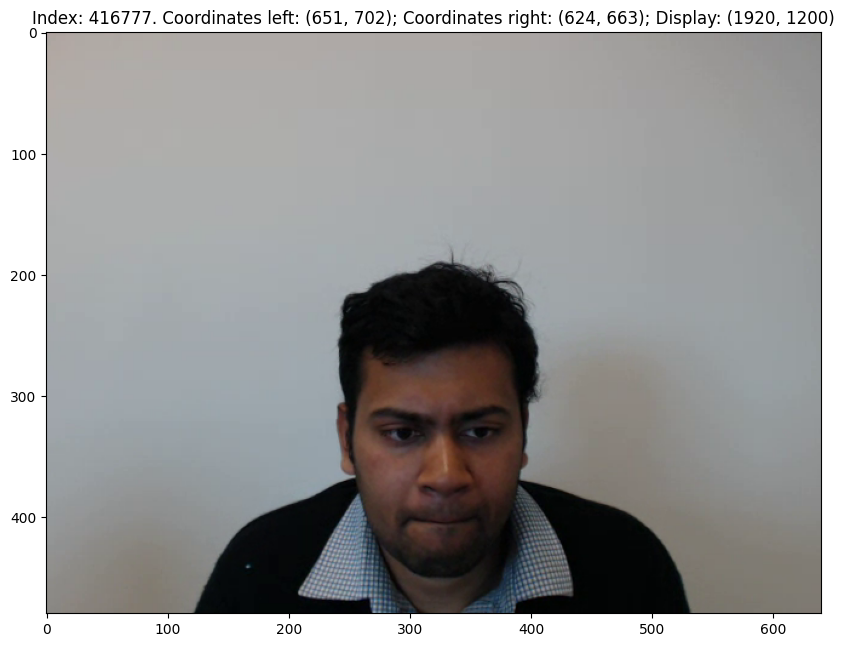

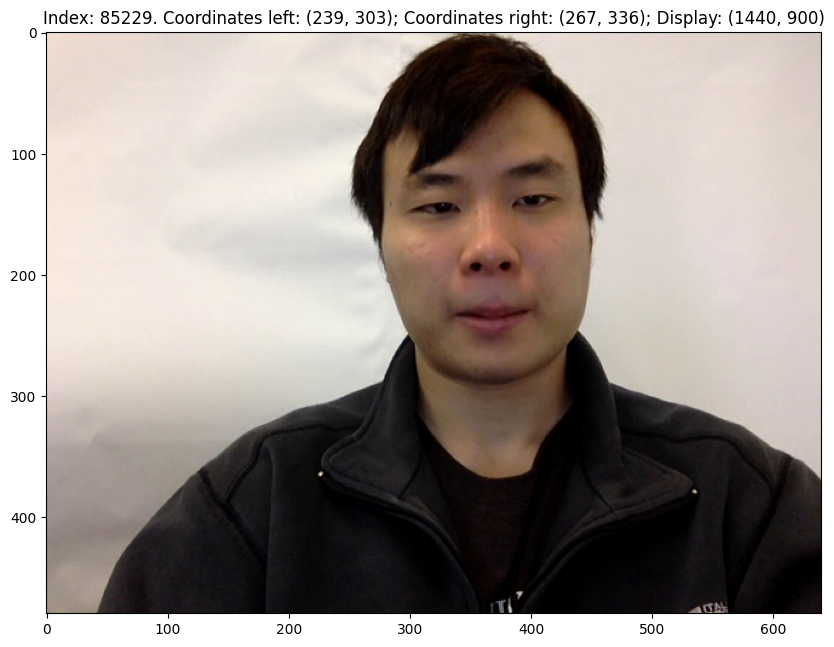

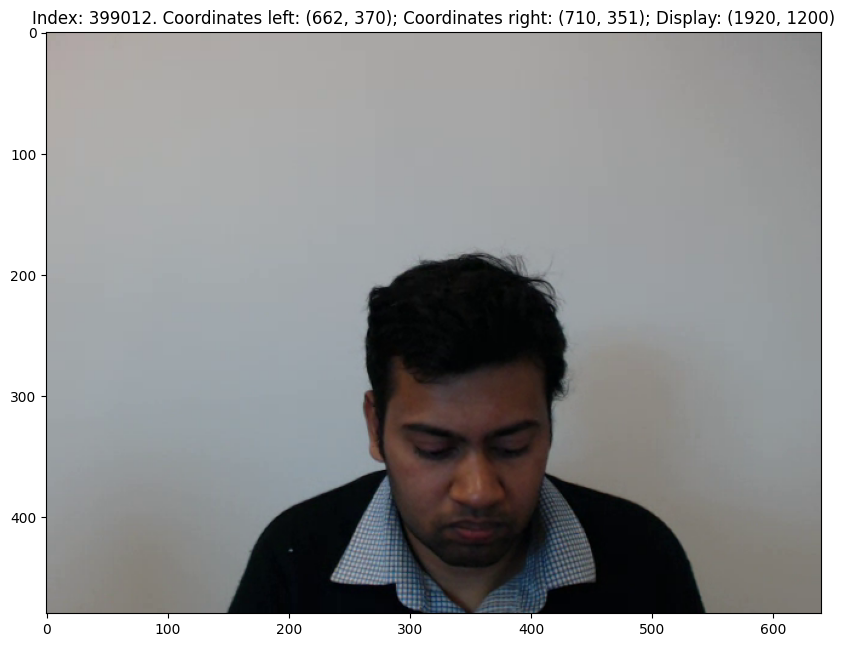

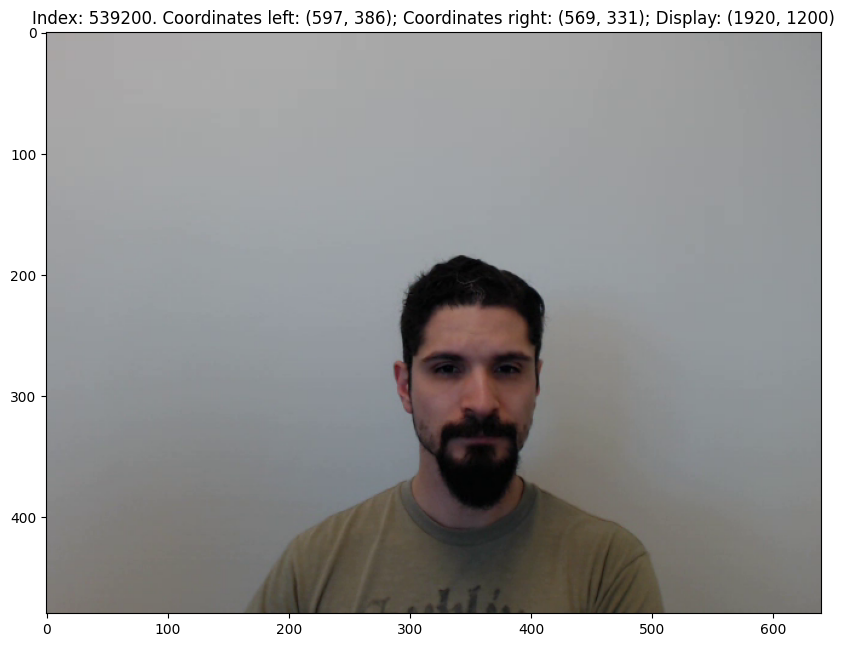

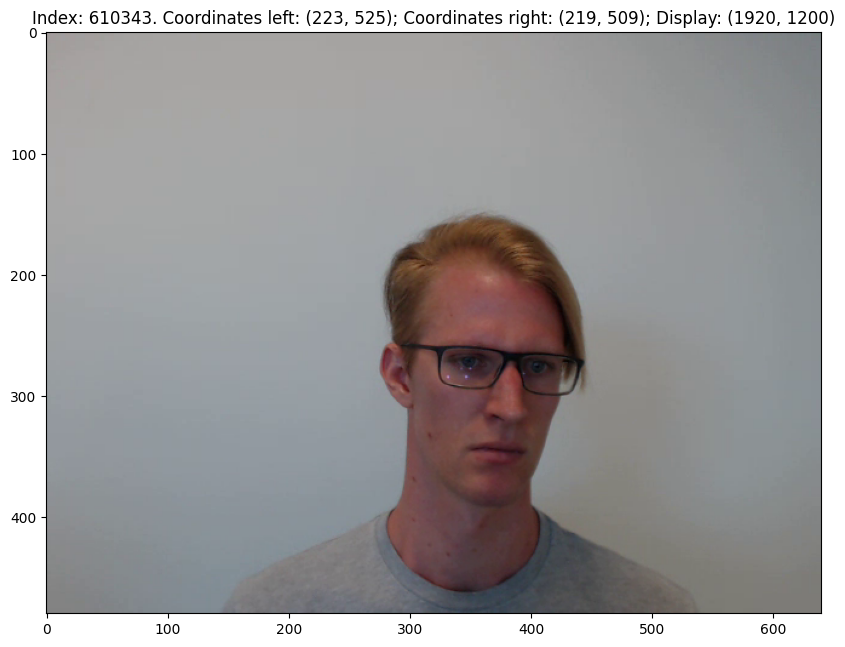

In [36]:
for index_test in random_indices:
    row = tob_df.iloc[index_test]
    path = row['paths']
    left_eye = (round(row["tob_left_x"] * row["display_width"]), round(row["tob_left_y"] * row["display_height"]))
    right_eye = (round(row["tob_right_x"] * row["display_width"]), round(row["tob_right_y"] * row["display_height"]))
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 8))
    plt.title(f'Index: {index_test}. Coordinates left: {left_eye}; Coordinates right: {right_eye}; Display: ({round(row["display_width"])}, {round(row["display_height"])})')
    plt.imshow(img)
    plt.show()